#**Pistachio Classification based on Geometric Object(Shape) Analysis using ML Algorithms:**
##Shape Classification, Feature Importance Analysis, Shape Characterization, Pattern Recognition, Dimensionality Reduction, Shape Similarity, Shape Transformation, Feature Engineering






Libraries to perform data analysis and visualization.

In [3]:
#Importing libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

Reading CSV file into DataFrame

In [ ]:
#loading data into a DataFrame to start exploring and manipulating
df = pd.read_csv('pistachio.csv')
df

,AREA,PERIMETER,MAJOR_AXIS,MINOR_AXIS,ECCENTRICITY,EQDIASQ,SOLIDITY,CONVEX_AREA,EXTENT,ASPECT_RATIO,ROUNDNESS,COMPACTNESS,SHAPEFACTOR_1,SHAPEFACTOR_2,SHAPEFACTOR_3,SHAPEFACTOR_4,Class
0,73107,1161.8070,442.4074,217.7261,0.8705,305.0946,0.9424,77579,0.7710,2.0319,0.6806,0.6896,0.0061,0.0030,0.4756,0.9664,Kirmizi_Pistachio
1,89272,1173.1810,460.2551,251.9546,0.8369,337.1419,0.9641,92598,0.7584,1.8267,0.8151,0.7325,0.0052,0.0028,0.5366,0.9802,Siit_Pistachio
2,60955,999.7890,386.9247,209.1255,0.8414,278.5863,0.9465,64400,0.7263,1.8502,0.7663,0.7200,0.0063,0.0034,0.5184,0.9591,Kirmizi_Pistachio
3,79537,1439.5129,466.7973,221.2136,0.8806,318.2289,0.9437,84281,0.7568,2.1102,0.4823,0.6817,0.0059,0.0028,0.4648,0.9807,Kirmizi_Pistachio
4,96395,1352.6740,515.8730,246.5945,0.8784,350.3340,0.9549,100950,0.7428,2.0920,0.6620,0.6791,0.0054,0.0026,0.4612,0.9648,Kirmizi_Pistachio
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1713,65570,2071.4451,418.0258,217.1458,0.8545,288.9400,0.8976,73054,0.5945,1.9251,0.1920,0.6912,0.0064,0.0033,0.4778,0.9197,Kirmizi_Pistachio
1714,68849,1441.2590,451.0457,205.2553,0.8905,296.0764,0.9340,73716,0.6459,2.1975,0.4165,0.6564,0.0066,0.0030,0.4309,0.9469,Kirmizi_Pistachio
1715,90270,1370.5380,428.9636,269.8232,0.7774,339.0211,0.9722,92847,0.7400,1.5898,0.6039,0.7903,0.0048,0.0030,0.6246,0.9930,Siit_Pistachio
1716,73148,1309.8430,469.0491,208.3141,0.8960,305.1801,0.9376,78014,0.6341,2.2516,0.5358,0.6506,0.0064,0.0028,0.4233,0.9532,Kirmizi_Pistachio


In [ ]:
#Head of the dataframe
df.head()

,AREA,PERIMETER,MAJOR_AXIS,MINOR_AXIS,ECCENTRICITY,EQDIASQ,SOLIDITY,CONVEX_AREA,EXTENT,ASPECT_RATIO,ROUNDNESS,COMPACTNESS,SHAPEFACTOR_1,SHAPEFACTOR_2,SHAPEFACTOR_3,SHAPEFACTOR_4,Class
0,73107,1161.8070,442.4074,217.7261,0.8705,305.0946,0.9424,77579,0.7710,2.0319,0.6806,0.6896,0.0061,0.0030,0.4756,0.9664,Kirmizi_Pistachio
1,89272,1173.1810,460.2551,251.9546,0.8369,337.1419,0.9641,92598,0.7584,1.8267,0.8151,0.7325,0.0052,0.0028,0.5366,0.9802,Siit_Pistachio
2,60955,999.7890,386.9247,209.1255,0.8414,278.5863,0.9465,64400,0.7263,1.8502,0.7663,0.7200,0.0063,0.0034,0.5184,0.9591,Kirmizi_Pistachio
3,79537,1439.5129,466.7973,221.2136,0.8806,318.2289,0.9437,84281,0.7568,2.1102,0.4823,0.6817,0.0059,0.0028,0.4648,0.9807,Kirmizi_Pistachio
4,96395,1352.6740,515.8730,246.5945,0.8784,350.3340,0.9549,100950,0.7428,2.0920,0.6620,0.6791,0.0054,0.0026,0.4612,0.9648,Kirmizi_Pistachio


In [ ]:
#Total Null items
df.isnull().sum()

AREA             0
PERIMETER        0
MAJOR_AXIS       0
MINOR_AXIS       0
ECCENTRICITY     0
EQDIASQ          0
SOLIDITY         0
CONVEX_AREA      0
EXTENT           0
ASPECT_RATIO     0
ROUNDNESS        0
COMPACTNESS      0
SHAPEFACTOR_1    0
SHAPEFACTOR_2    0
SHAPEFACTOR_3    0
SHAPEFACTOR_4    0
Class            0
dtype: int64

In [ ]:
#Column names
df.columns

Index(['AREA', 'PERIMETER', 'MAJOR_AXIS', 'MINOR_AXIS', 'ECCENTRICITY',
       'EQDIASQ', 'SOLIDITY', 'CONVEX_AREA', 'EXTENT', 'ASPECT_RATIO',
       'ROUNDNESS', 'COMPACTNESS', 'SHAPEFACTOR_1', 'SHAPEFACTOR_2',
       'SHAPEFACTOR_3', 'SHAPEFACTOR_4', 'Class'],
      dtype='object')

In [ ]:
df["AREA"].min(), df["AREA"].max()

(29808, 124008)

In [ ]:
df["PERIMETER"].min(), df["PERIMETER"].max()

(858.363, 2755.0491)

In [ ]:
#Info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1718 entries, 0 to 1717
Data columns (total 17 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   AREA           1718 non-null   int64  
 1   PERIMETER      1718 non-null   float64
 2   MAJOR_AXIS     1718 non-null   float64
 3   MINOR_AXIS     1718 non-null   float64
 4   ECCENTRICITY   1718 non-null   float64
 5   EQDIASQ        1718 non-null   float64
 6   SOLIDITY       1718 non-null   float64
 7   CONVEX_AREA    1718 non-null   int64  
 8   EXTENT         1718 non-null   float64
 9   ASPECT_RATIO   1718 non-null   float64
 10  ROUNDNESS      1718 non-null   float64
 11  COMPACTNESS    1718 non-null   float64
 12  SHAPEFACTOR_1  1718 non-null   float64
 13  SHAPEFACTOR_2  1718 non-null   float64
 14  SHAPEFACTOR_3  1718 non-null   float64
 15  SHAPEFACTOR_4  1718 non-null   float64
 16  Class          1718 non-null   object 
dtypes: float64(14), int64(2), object(1)
memory usage: 22

In [ ]:
#Describe
df.describe()

,AREA,PERIMETER,MAJOR_AXIS,MINOR_AXIS,ECCENTRICITY,EQDIASQ,SOLIDITY,CONVEX_AREA,EXTENT,ASPECT_RATIO,ROUNDNESS,COMPACTNESS,SHAPEFACTOR_1,SHAPEFACTOR_2,SHAPEFACTOR_3,SHAPEFACTOR_4
count,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000
mean,79871.952852,1421.797588,446.206444,238.193128,0.840347,317.790000,0.940103,84947.671129,0.716055,1.899342,0.570831,0.712841,0.005704,0.003017,0.510097,0.955185
std,12968.217051,373.408835,31.885328,30.426445,0.049026,26.571699,0.050006,13081.742551,0.052534,0.241253,0.211514,0.044230,0.000810,0.000334,0.063391,0.051735
min,29808.000000,858.363000,321.425500,133.509600,0.504900,194.814600,0.588000,37935.000000,0.427200,1.158500,0.062800,0.476000,0.004000,0.002400,0.226600,0.620400
25%,71898.500000,1169.633225,426.554100,217.875475,0.817500,302.562375,0.920250,76357.750000,0.688100,1.736325,0.372325,0.682000,0.005200,0.002800,0.465125,0.944200
50%,79795.000000,1260.785500,448.453150,235.888750,0.850250,318.744650,0.953800,84973.000000,0.726100,1.899550,0.643850,0.709750,0.005600,0.003000,0.503750,0.972800
75%,88980.000000,1599.479000,467.515200,257.433625,0.875375,336.590000,0.976300,93660.750000,0.753600,2.068575,0.744450,0.741600,0.006100,0.003200,0.549975,0.986800
max,124008.000000,2755.049100,535.642200,383.046100,0.946000,397.356100,0.995100,132478.000000,0.820400,3.085800,0.933600,0.869500,0.013100,0.005300,0.756100,0.999000


#1. **Shape Classification**: Build classification models to predict the class label based on the geometric measurements.

"Shape Classification" refers to the process of building machine learning models that can predict the class label or category of an object based on its geometric measurements or characteristics.

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split #This is used to split dataset into training and testing subsets.
from sklearn.ensemble import RandomForestClassifier
#RFC - ensemble learning method that combines multiple decision trees to create a more accurate and robust classification model.
from sklearn.metrics import accuracy_score, classification_report #These functions are used to evaluate performance of classification model.
# Split features and target variable
X = df.drop(columns=['Class'])
y = df['Class']

# Split the data into training and testing sets
#It randomly shuffles and divides data such that 80% is for training (X_train and y_train) and 20% is used for testing (X_test and y_test).
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the Random Forest classifier
clf = RandomForestClassifier()#this initializes an instance of the RandomForestClassifier model.

# Train the model
clf.fit(X_train, y_train) #fitting it to the features (X_train) and corresponding class labels (y_train).

# Make predictions
y_pred = clf.predict(X_test) #This line makes predictions on the testing data using the trained classifier.

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred) #calculates accuracy of model by comparing predicted class labels (y_pred) with true class labels from testing data (y_test).
classification_rep = classification_report(y_test, y_pred)
#provides detailed information about the model's performance, including precision, recall, F1-score, and support for each class.

print("Accuracy:", accuracy)
print("Classification Report:\n", classification_rep)

Accuracy: 0.8604651162790697
Classification Report:
                    precision    recall  f1-score   support

Kirmizi_Pistachio       0.88      0.89      0.88       201
   Siit_Pistachio       0.84      0.83      0.83       143

         accuracy                           0.86       344
        macro avg       0.86      0.86      0.86       344
     weighted avg       0.86      0.86      0.86       344



In [ ]:
from sklearn.preprocessing import StandardScaler

# Split dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Feature scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initialize a Random Forest classifier
model = RandomForestClassifier(random_state=42)

# Train the model
model.fit(X_train_scaled, y_train)

# Make predictions
y_pred = model.predict(X_test_scaled)

In [ ]:
# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.875


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score

# Split the data into features (X) and target labels (y)
X = df.drop('Class', axis=1)
y = df['Class']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the Decision Tree classifier
classifier = DecisionTreeClassifier()

# Train the classifier on the training data
classifier.fit(X_train, y_train)

# Make predictions on the test data
predictions = classifier.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, predictions)
print(f"Accuracy: {accuracy:.2f}")


Accuracy: 0.83


Grid search is a hyperparameter tuning technique used in machine learning to systematically search through a predefined set of hyperparameter combinations for a given machine learning algorithm. Hyperparameters are parameters that are not learned during the training process but are set before training begins. They control various aspects of the training process and the model's behavior.

In [ ]:
#GridSearchCV is used for hyperparameter tuning using cross-validation.
from sklearn.model_selection import train_test_split, GridSearchCV
#DecisionTreeClassifier is a classification algorithm based on decision trees.
from sklearn.tree import DecisionTreeClassifier
# It will be used to calculate the accuracy of the model's predictions.
from sklearn.metrics import accuracy_score
#StandardScaler is used to standardize the features.
from sklearn.preprocessing import StandardScaler


# Define the hyperparameters and their ranges to tune
#This is a dictionary that defines the hyperparameters to be tuned and their corresponding ranges.
param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Initialize the GridSearchCV
grid_search = GridSearchCV(estimator=classifier, param_grid=param_grid, cv=5, scoring='accuracy')

# Perform the grid search
grid_search.fit(X_train, y_train)

# Get the best parameters and estimator
best_params = grid_search.best_params_
best_estimator = grid_search.best_estimator_

# Make predictions on the test data using the best estimator
predictions = best_estimator.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, predictions)
print(f"Best Parameters: {best_params}")
print(f"Accuracy: {accuracy:.2f}")

Best Parameters: {'criterion': 'entropy', 'max_depth': 30, 'min_samples_leaf': 2, 'min_samples_split': 10}
Accuracy: 0.80


This code demonstrates the workflow of building and evaluating multiple classification models using standardization, training, and accuracy assessment.

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler



# Standardize the feature values
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Random Forest Classifier
rf_classifier = RandomForestClassifier(random_state=42)
rf_classifier.fit(X_train, y_train)
rf_predictions = rf_classifier.predict(X_test)
rf_accuracy = accuracy_score(y_test, rf_predictions)
print(f"Random Forest Accuracy: {rf_accuracy:.2f}")

# Support Vector Machine Classifier
#An SVC model is initialized with a specified random state and then fitted to the training data.
svm_classifier = SVC(random_state=42)
svm_classifier.fit(X_train, y_train)
svm_predictions = svm_classifier.predict(X_test)
svm_accuracy = accuracy_score(y_test, svm_predictions)
print(f"SVM Accuracy: {svm_accuracy:.2f}")

# Neural Network Classifier using scikit-learn
#(neural network) model is initialized with a specified random state and then fitted to the training data.
#Predictions are made on the test data, and accuracy is calculated and printed.
mlp_classifier = MLPClassifier(random_state=42)
mlp_classifier.fit(X_train, y_train)
mlp_predictions = mlp_classifier.predict(X_test)
mlp_accuracy = accuracy_score(y_test, mlp_predictions)
print(f"Neural Network (scikit-learn) Accuracy: {mlp_accuracy:.2f}")


Random Forest Accuracy: 0.88
SVM Accuracy: 0.88
Neural Network (scikit-learn) Accuracy: 0.88


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import accuracy_score
from keras.models import Sequential
from keras.layers import Dense
from keras.utils import np_utils



# Encode the target labels
encoder = LabelEncoder()
y_encoded = encoder.fit_transform(y)
y_encoded = np_utils.to_categorical(y_encoded)

# Standardize the feature values
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_encoded, test_size=0.2, random_state=42)

# Neural Network Classifier using Keras
model = Sequential()
model.add(Dense(64, input_dim=X_train.shape[1], activation='relu'))
model.add(Dense(32, activation='relu'))
model.add(Dense(len(encoder.classes_), activation='softmax'))
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
model.fit(X_train, y_train, epochs=50, batch_size=32, verbose=0)

# Evaluate the model
_, nn_accuracy = model.evaluate(X_test, y_test)
print(f"Neural Network (Keras) Accuracy: {nn_accuracy:.2f}")


11/11 [==============================] - 0s 2ms/step - loss: 0.2888 - accuracy: 0.8692
Neural Network (Keras) Accuracy: 0.87


In [ ]:
#a Grid Search for Random Forest:
from sklearn.model_selection import GridSearchCV

# Define the parameter grid
param_grid_rf = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10]
}

# Initialize the Random Forest classifier
rf_classifier = RandomForestClassifier(random_state=42)

# Initialize the GridSearchCV
grid_search_rf = GridSearchCV(estimator=rf_classifier, param_grid=param_grid_rf, cv=5, scoring='accuracy')

# Perform the grid search
grid_search_rf.fit(X_train, y_train)

# Get the best parameters and estimator
best_params_rf = grid_search_rf.best_params_
best_estimator_rf = grid_search_rf.best_estimator_

# Evaluate the model with the best estimator
rf_predictions = best_estimator_rf.predict(X_test)
rf_accuracy = accuracy_score(y_test, rf_predictions)
print(f"Random Forest Best Parameters: {best_params_rf}")
print(f"Random Forest Accuracy: {rf_accuracy:.2f}")


Random Forest Best Parameters: {'max_depth': 10, 'min_samples_split': 2, 'n_estimators': 100}
Random Forest Accuracy: 0.87


In [ ]:
#experiment with the architecture and training parameters:
from keras.layers import Dropout

# Initialize the Neural Network model
model = Sequential()
model.add(Dense(128, input_dim=X_train.shape[1], activation='relu'))
model.add(Dropout(0.2))  # Adding dropout for regularization
model.add(Dense(64, activation='relu'))
model.add(Dense(len(encoder.classes_), activation='softmax'))

# Compile the model
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# Train the model with modified training parameters
model.fit(X_train, y_train, epochs=100, batch_size=64, validation_data=(X_test, y_test), verbose=1)


Epoch 1/100
22/22 [==============================] - 1s 14ms/step - loss: 0.5356 - accuracy: 0.7365 - val_loss: 0.3400 - val_accuracy: 0.8634
Epoch 2/100
22/22 [==============================] - 0s 6ms/step - loss: 0.3321 - accuracy: 0.8559 - val_loss: 0.3130 - val_accuracy: 0.8663
Epoch 3/100
22/22 [==============================] - 0s 5ms/step - loss: 0.3157 - accuracy: 0.8668 - val_loss: 0.3079 - val_accuracy: 0.8663
Epoch 4/100
22/22 [==============================] - 0s 5ms/step - loss: 0.3087 - accuracy: 0.8734 - val_loss: 0.3063 - val_accuracy: 0.8750
Epoch 5/100
22/22 [==============================] - 0s 5ms/step - loss: 0.3049 - accuracy: 0.8719 - val_loss: 0.3058 - val_accuracy: 0.8692
Epoch 6/100
22/22 [==============================] - 0s 2ms/step - loss: 0.3042 - accuracy: 0.8814 - val_loss: 0.3047 - val_accuracy: 0.8692
Epoch 7/100
22/22 [==============================] - 0s 3ms/step - loss: 0.3016 - accuracy: 0.8712 - val_loss: 0.3040 - val_accuracy: 0.8750
Epoch 8/100


In [ ]:
from sklearn.model_selection import cross_val_score
# Feature scaling
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Initialize a Random Forest classifier
model = RandomForestClassifier(random_state=42)

# Perform cross-validation
cv_scores = cross_val_score(model, X_scaled, y, cv=5)  # 5-fold cross-validation

# Print cross-validation scores
print("Cross-Validation Scores:", cv_scores)
print("Mean Accuracy:", cv_scores.mean())
print("Standard Deviation of Accuracy:", cv_scores.std())

Cross-Validation Scores: [0.85465116 0.87209302 0.88953488 0.85131195 0.86297376]
Mean Accuracy: 0.8661129568106313
Standard Deviation of Accuracy: 0.013745143368868076


Confusion Matrix and Cross Validation Accuracy

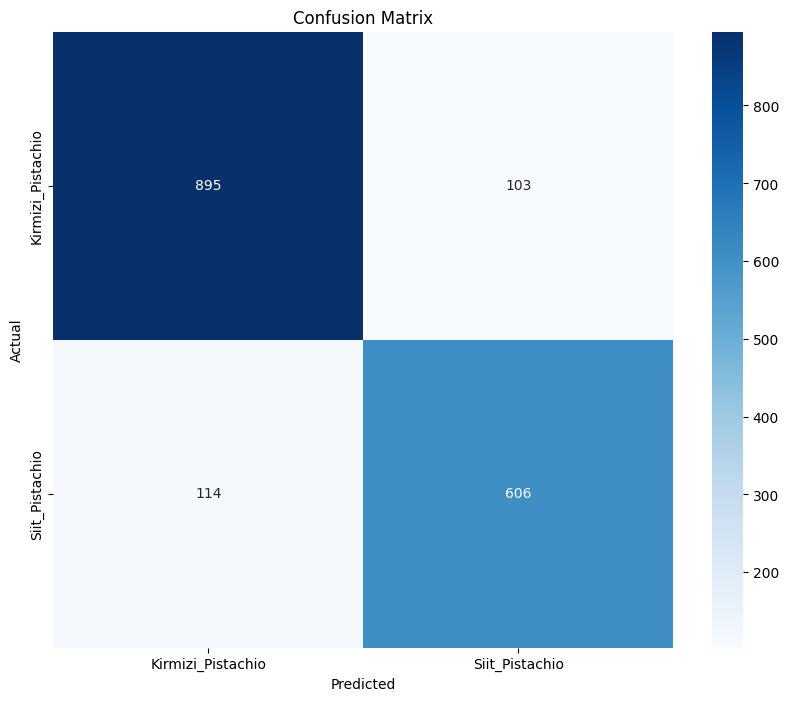

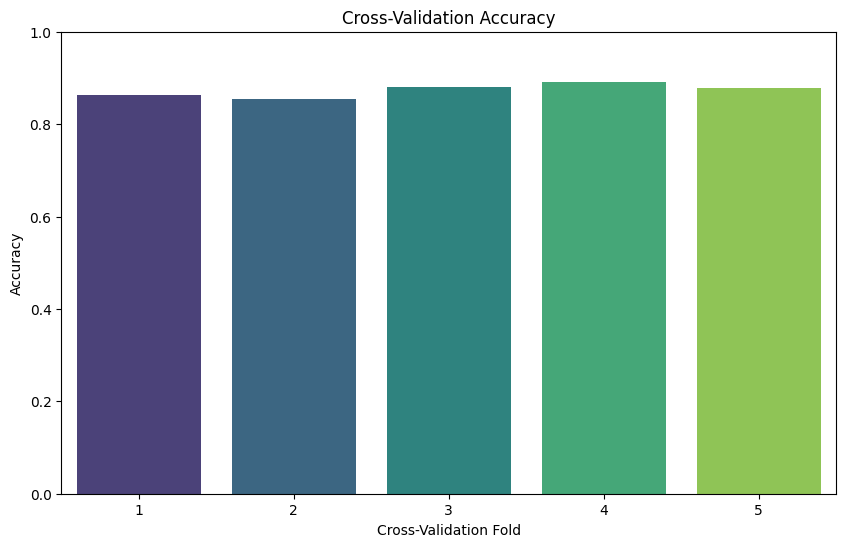

In [ ]:
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import StratifiedKFold
# Feature scaling
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Initialize a Random Forest classifier
model = RandomForestClassifier(random_state=42)

# Perform cross-validation with predictions
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
y_pred_cv = cross_val_predict(model, X_scaled, y, cv=cv)

# Confusion matrix
conf_mat = confusion_matrix(y, y_pred_cv, labels=df['Class'].unique())

# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_mat, annot=True, fmt="d", cmap="Blues",
            xticklabels=df['Class'].unique(), yticklabels=df['Class'].unique())
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# Bar plot of cross-validation accuracy
cv_scores = cross_val_score(model, X_scaled, y, cv=cv)
plt.figure(figsize=(10, 6))
sns.barplot(x=list(range(1, 6)), y=cv_scores, palette="viridis")
plt.xlabel("Cross-Validation Fold")
plt.ylabel("Accuracy")
plt.title("Cross-Validation Accuracy")
plt.ylim(0, 1)
plt.show()

##2. **Feature Importance Analysis**: Determine which geometric measurements have the most significant impact on the class prediction.

          Feature  Importance
12  SHAPEFACTOR_1    0.166358
3      MINOR_AXIS    0.166102
9    ASPECT_RATIO    0.085064
11    COMPACTNESS    0.080769
14  SHAPEFACTOR_3    0.076046
5         EQDIASQ    0.060099
0            AREA    0.059102
15  SHAPEFACTOR_4    0.054879
7     CONVEX_AREA    0.050197
4    ECCENTRICITY    0.043303
10      ROUNDNESS    0.031295
6        SOLIDITY    0.030572
1       PERIMETER    0.029898
8          EXTENT    0.029518
2      MAJOR_AXIS    0.023898
13  SHAPEFACTOR_2    0.012900


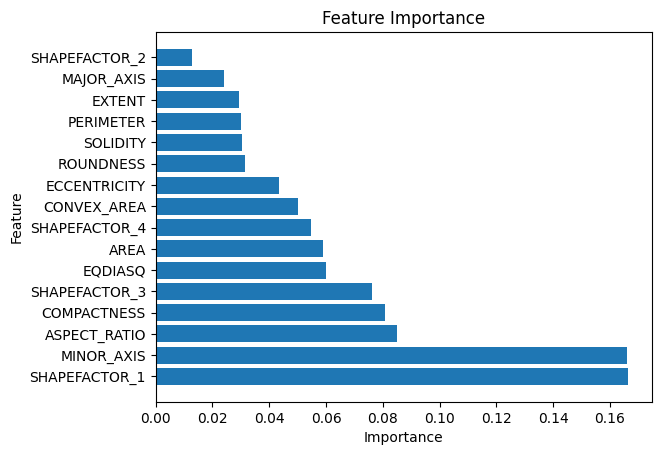

In [ ]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the Random Forest classifier
rf_classifier = RandomForestClassifier(random_state=42)
rf_classifier.fit(X_train, y_train)

# Get feature importances
feature_importances = rf_classifier.feature_importances_

# Create a DataFrame to display feature importances
importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': feature_importances})
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# Print and plot feature importances
print(importance_df)
plt.barh(importance_df['Feature'], importance_df['Importance'])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importance')
plt.show()


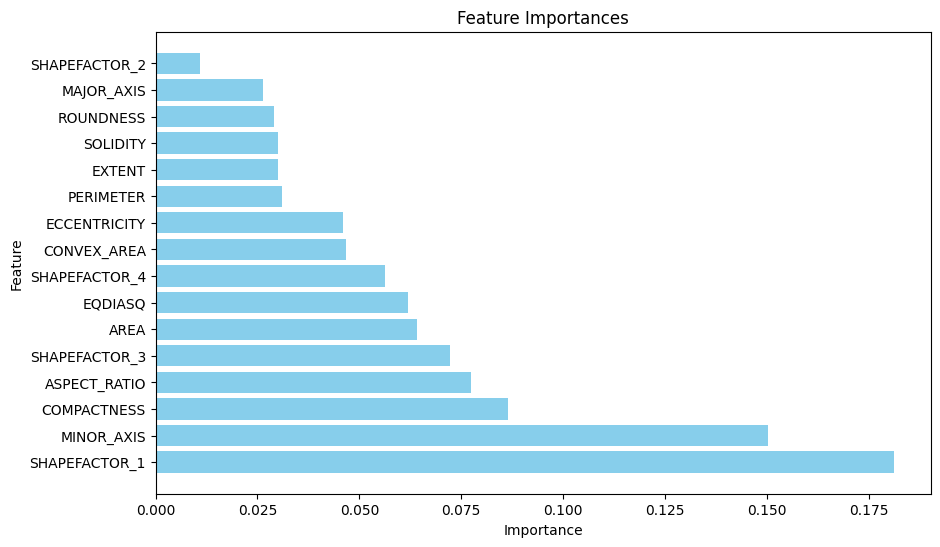

In [ ]:

# Initialize a Random Forest classifier
model = RandomForestClassifier(random_state=42)

# Fit the model on the entire dataset
model.fit(X, y)

# Get feature importances
feature_importances = model.feature_importances_

# Create a DataFrame to store feature importances
feature_importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': feature_importances})

# Sort features by importance
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Plot feature importances
plt.figure(figsize=(10, 6))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'], color='skyblue')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importances')
plt.show()


##3. **Shape Characterization**: Analyze the relationships between different geometric measurements to understand the characteristics of different shapes.

Shape Characterization refers to the process of analyzing and understanding the unique geometric properties and characteristics of different shapes.

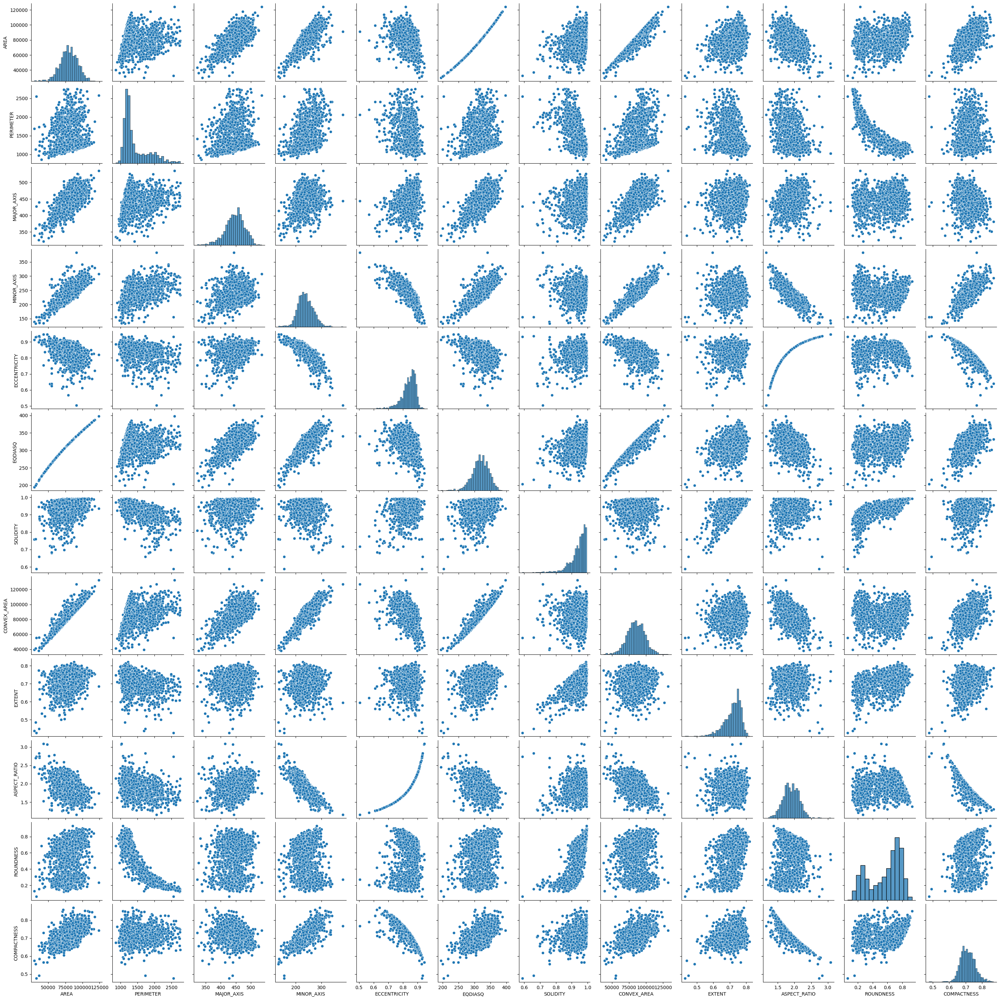

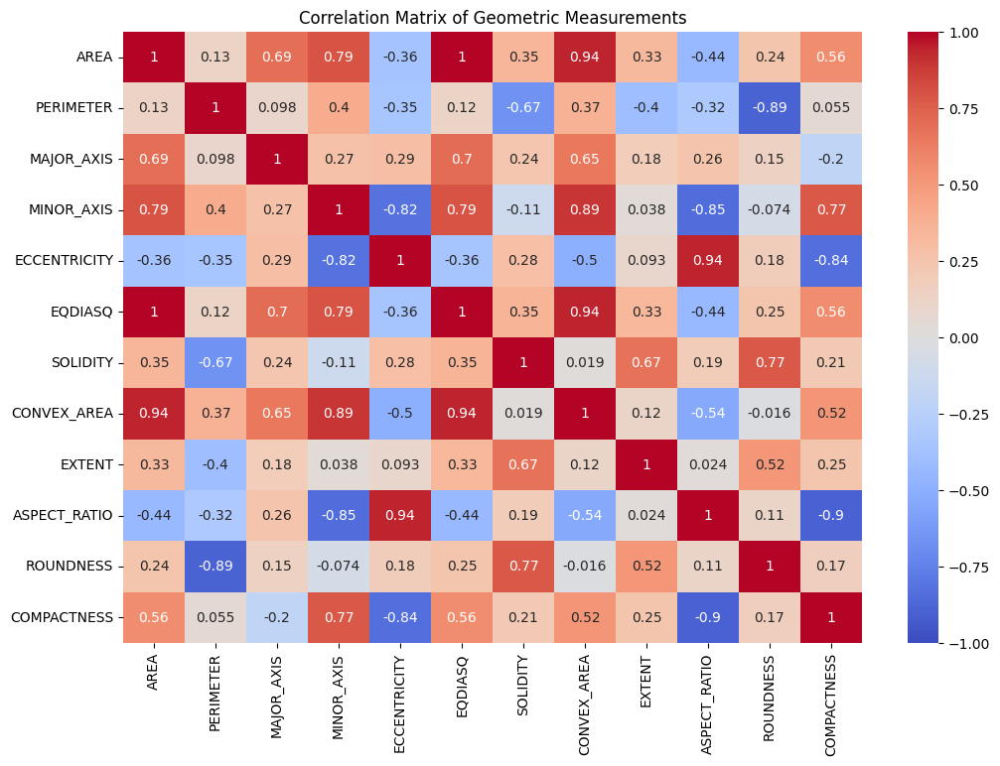

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the dataset
df = pd.read_csv("pistachio.csv")

# Select only the geometric measurement columns
#A list named geometric_columns is defined, containing the names of columns that correspond to different geometric measurements.
#These are the columns from the dataset that describe the geometric properties of objects.
geometric_columns = [
    "AREA", "PERIMETER", "MAJOR_AXIS", "MINOR_AXIS",
    "ECCENTRICITY", "EQDIASQ", "SOLIDITY", "CONVEX_AREA",
    "EXTENT", "ASPECT_RATIO", "ROUNDNESS", "COMPACTNESS"
]
#The code creates a new DataFrame geometric_data by selecting only the columns listed in geometric_columns from the original DataFrame df.
geometric_data = df[geometric_columns]

# Create a pair plot to visualize relationships between geometric measurements
sns.pairplot(geometric_data)
plt.show()

# Create a correlation matrix heatmap
correlation_matrix = geometric_data.corr()
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", vmin=-1, vmax=1)
plt.title("Correlation Matrix of Geometric Measurements")
plt.show()


##4. **Pattern Recognition**: Explore patterns in the geometric measurements that correspond to specific class labels.

"Pattern Recognition" refers to the process of identifying and interpreting patterns within data that can be used to distinguish between different classes or categories. In the context of geometric measurements, pattern recognition involves analyzing the relationships between specific geometric features and the corresponding class labels. The goal is to find distinctive patterns or trends in the measurements that are indicative of different classes of objects.

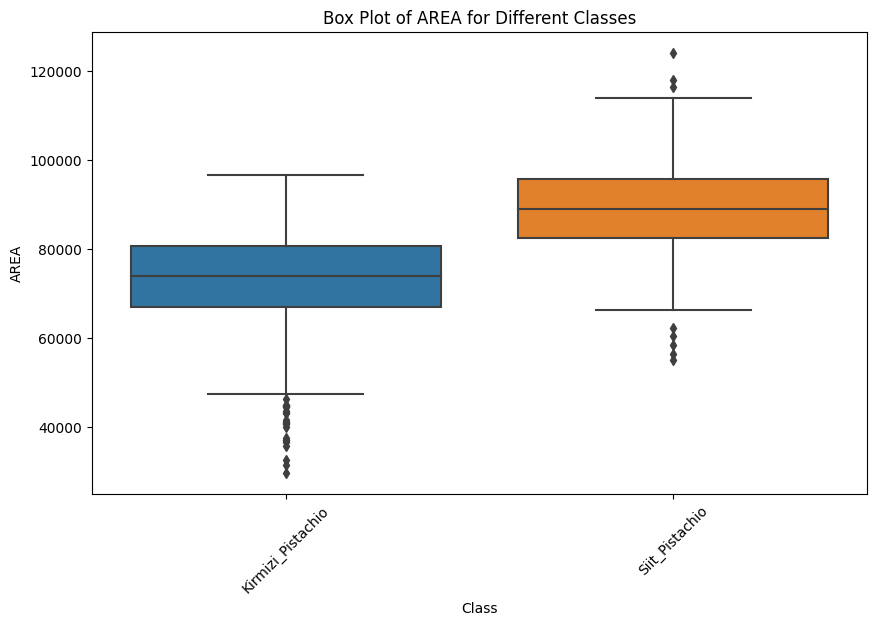

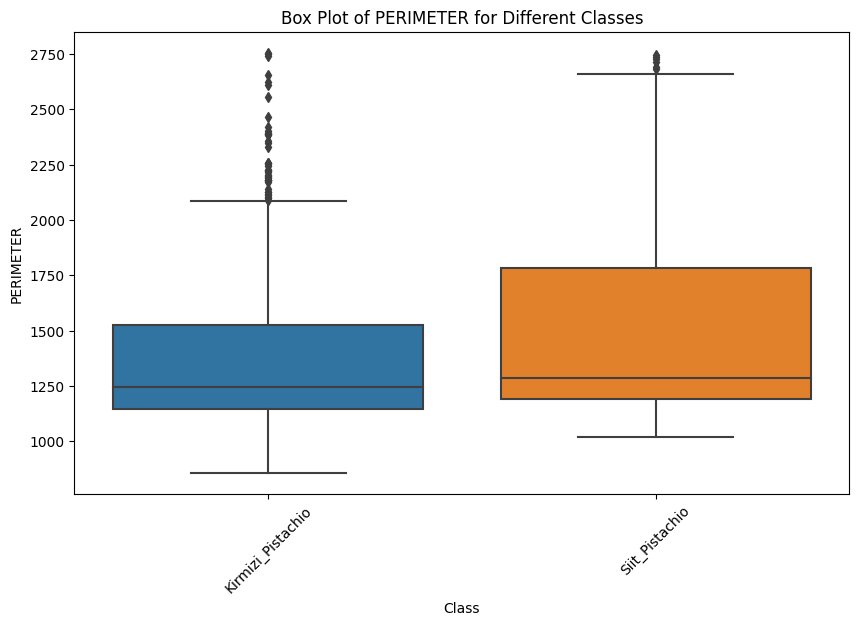

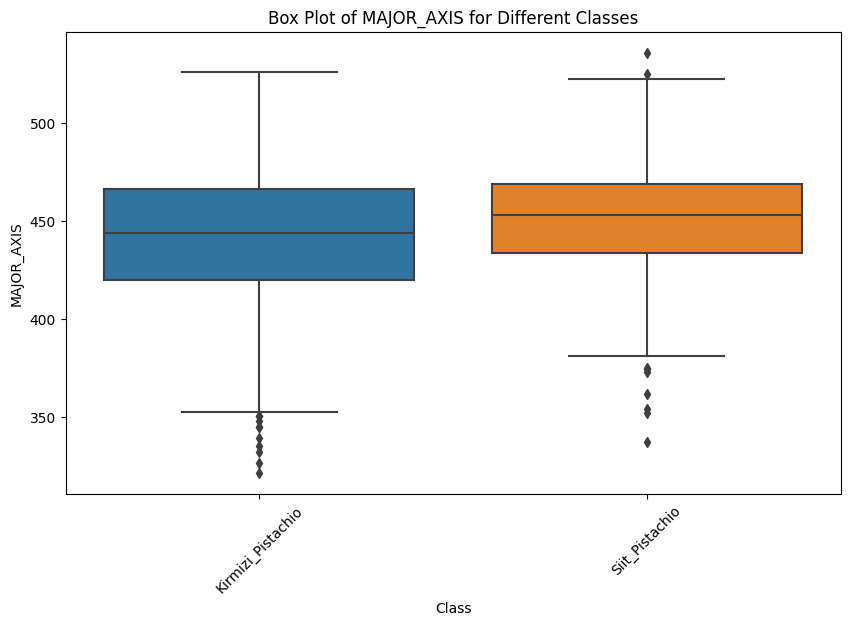

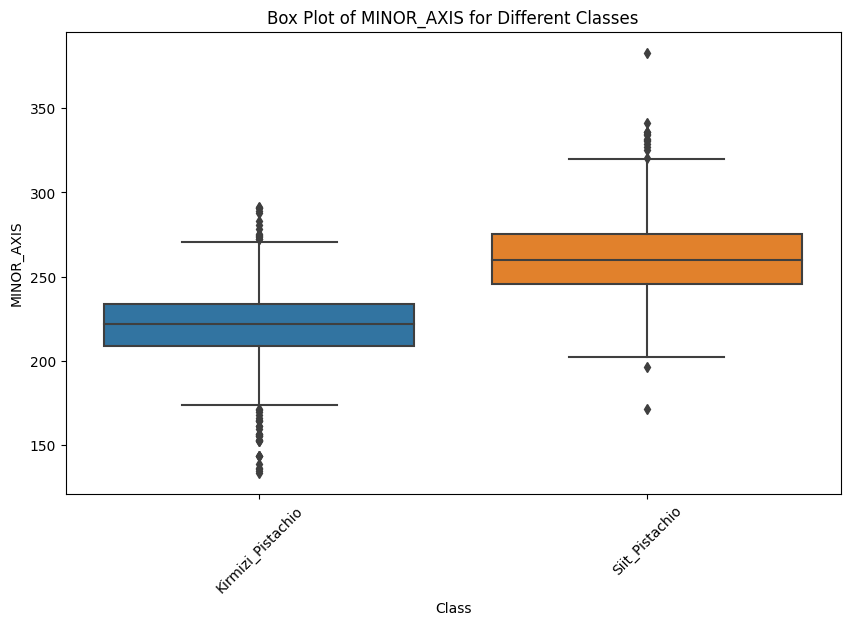

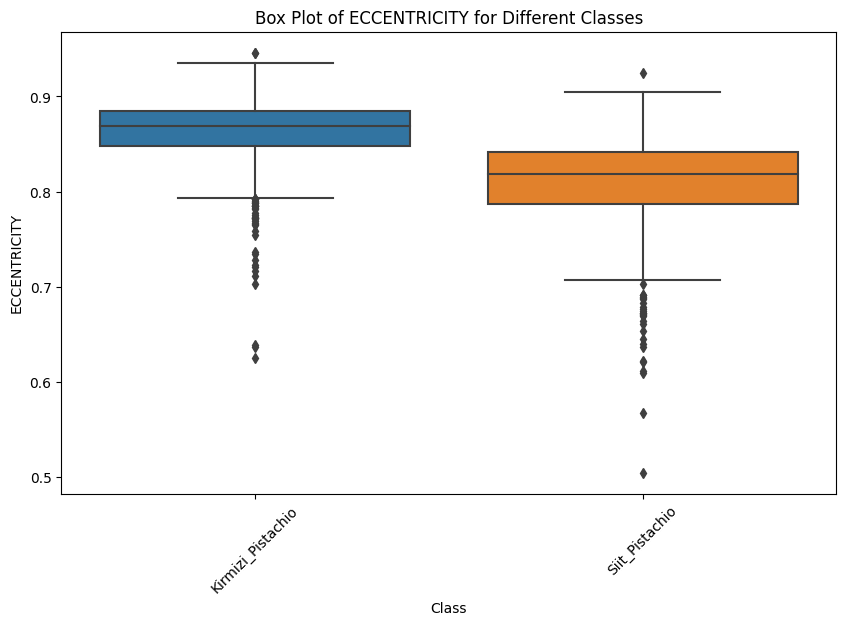

...

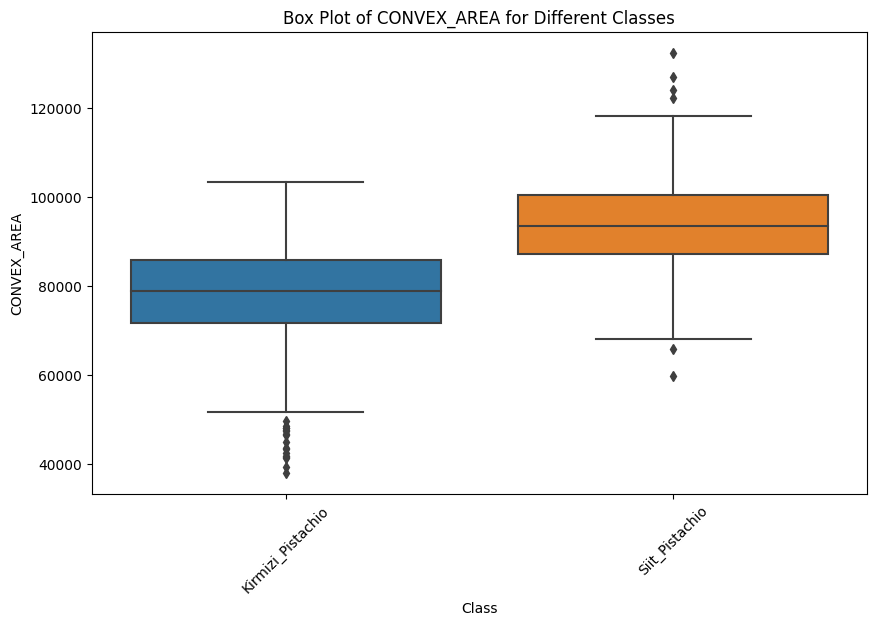

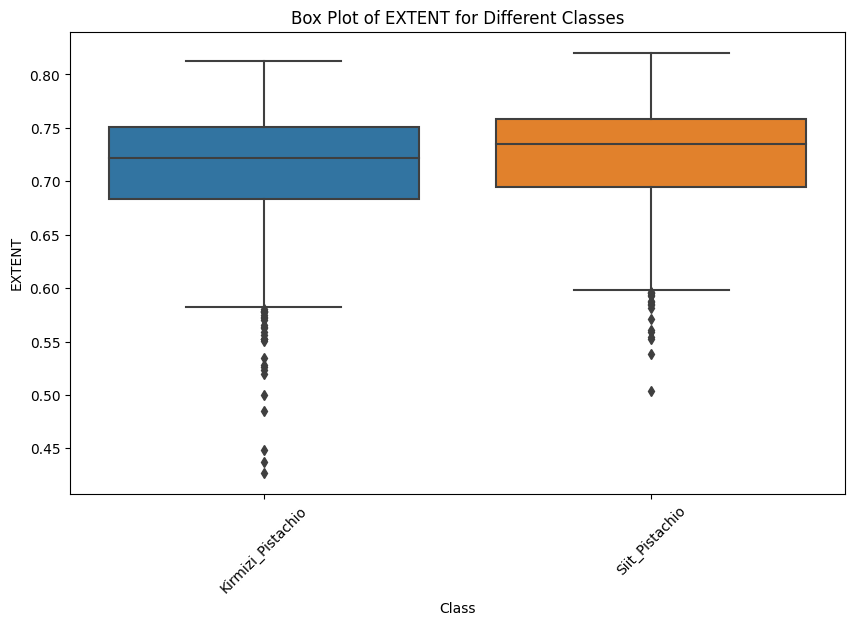

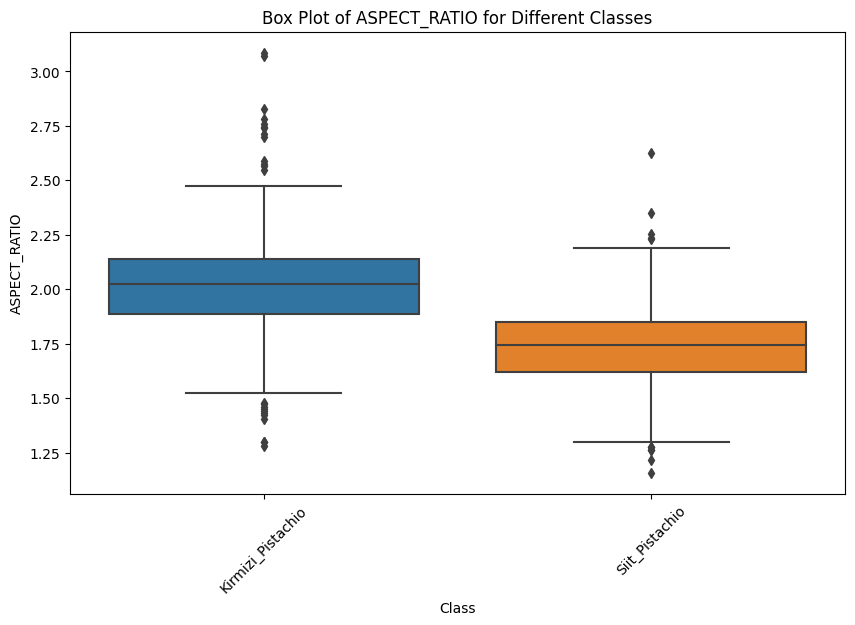

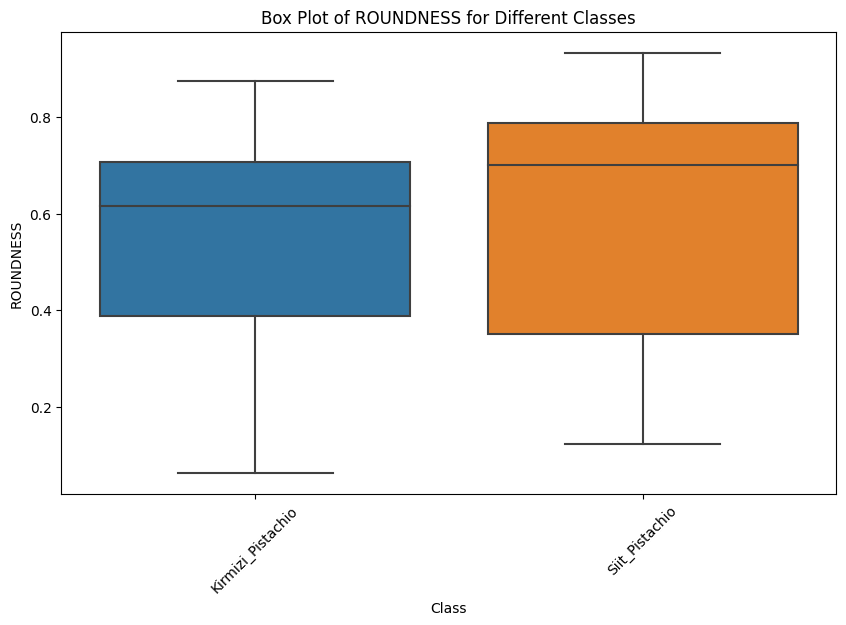

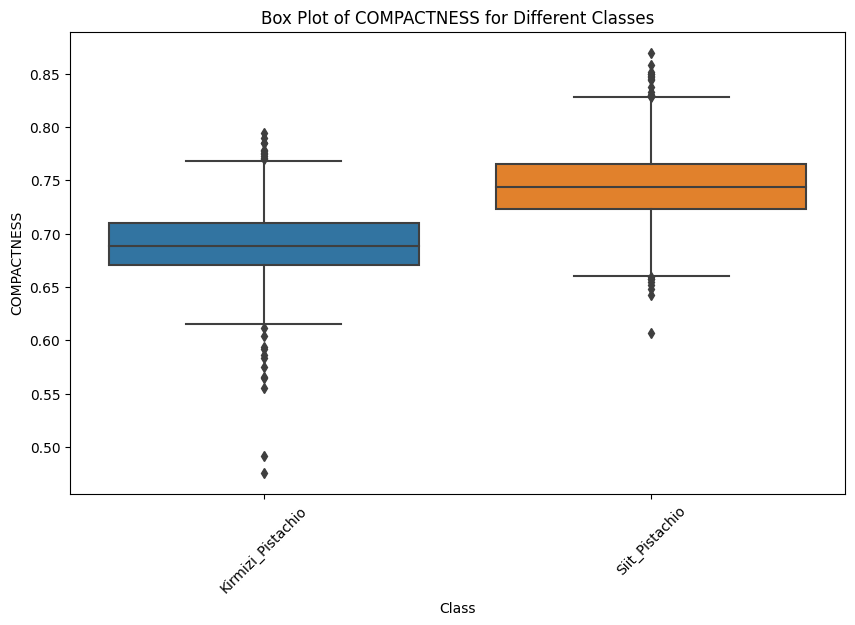

In [ ]:

# Define the list of geometric measurements
geometric_columns = [
    "AREA", "PERIMETER", "MAJOR_AXIS", "MINOR_AXIS",
    "ECCENTRICITY", "EQDIASQ", "SOLIDITY", "CONVEX_AREA",
    "EXTENT", "ASPECT_RATIO", "ROUNDNESS", "COMPACTNESS"
]

# Loop through each geometric measurement and create box plots
#The code then enters a loop that iterates through each geometric measurement in the geometric_columns list.
for column in geometric_columns:
    plt.figure(figsize=(10, 6))
    sns.boxplot(x="Class", y=column, data=df)
    plt.title(f"Box Plot of {column} for Different Classes")
    plt.xticks(rotation=45)
    plt.show()


Violin Plot

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 11.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 35.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 24.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


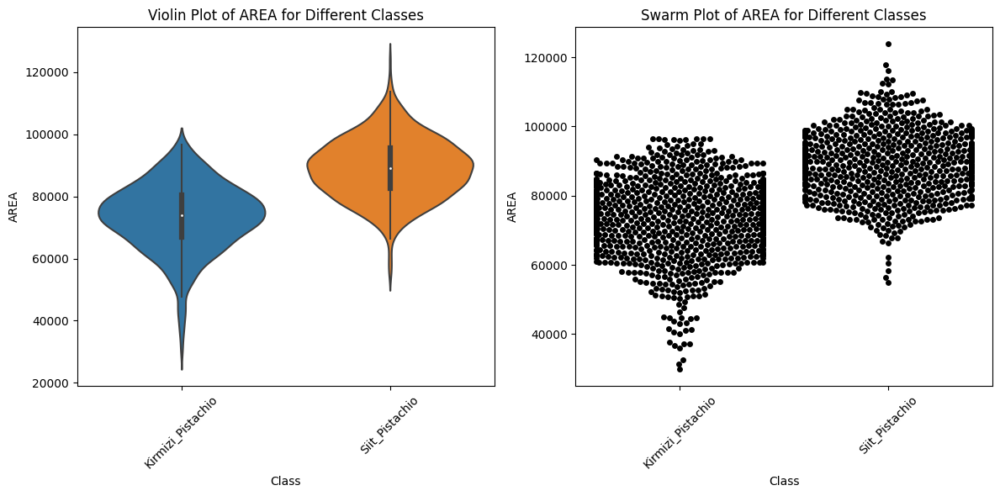

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 19.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 12.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 35.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 27.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


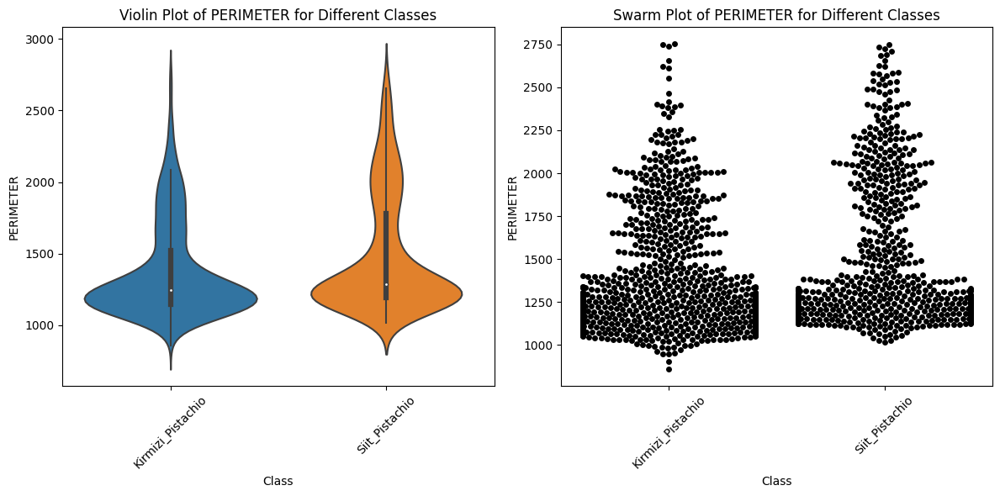

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 17.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 15.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


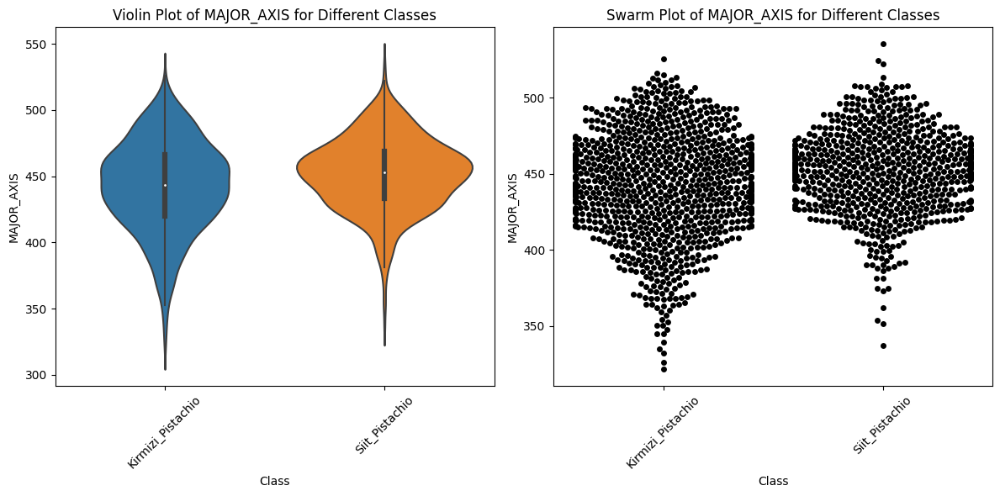

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 26.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 8.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 44.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 30.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


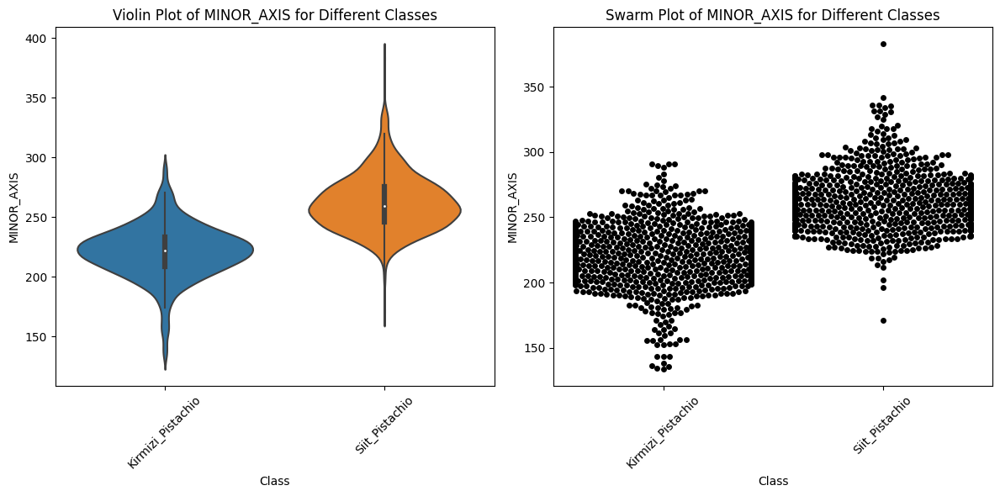

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 37.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 10.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 54.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 28.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


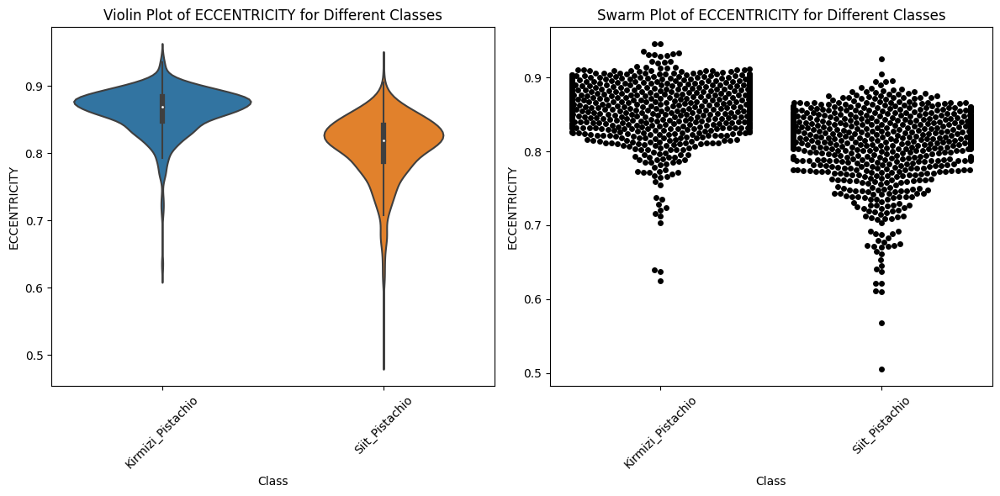

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 13.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 6.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 34.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 26.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


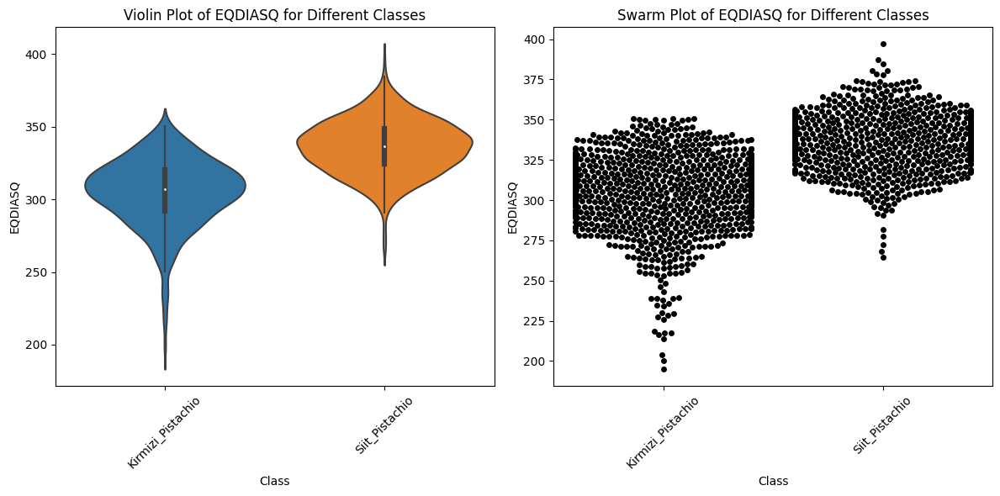

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 24.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 22.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 43.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 38.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


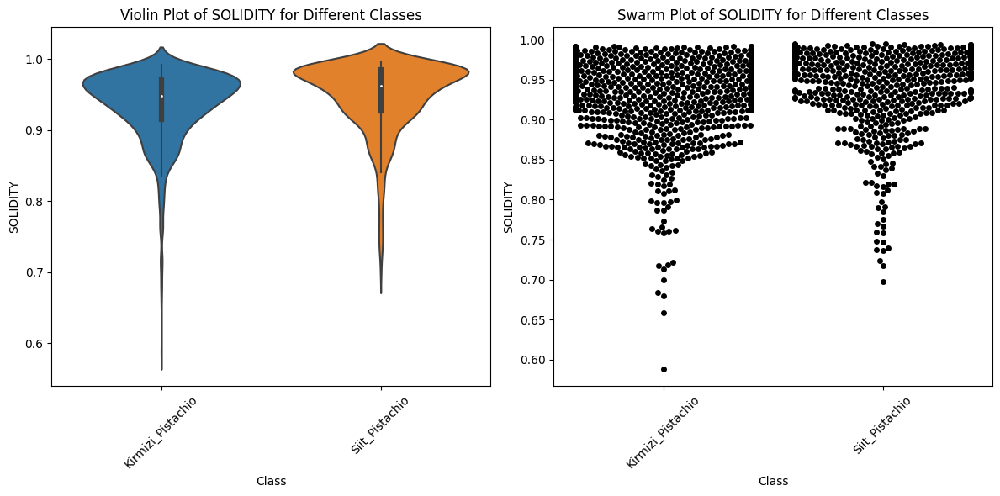

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 11.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 34.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 24.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


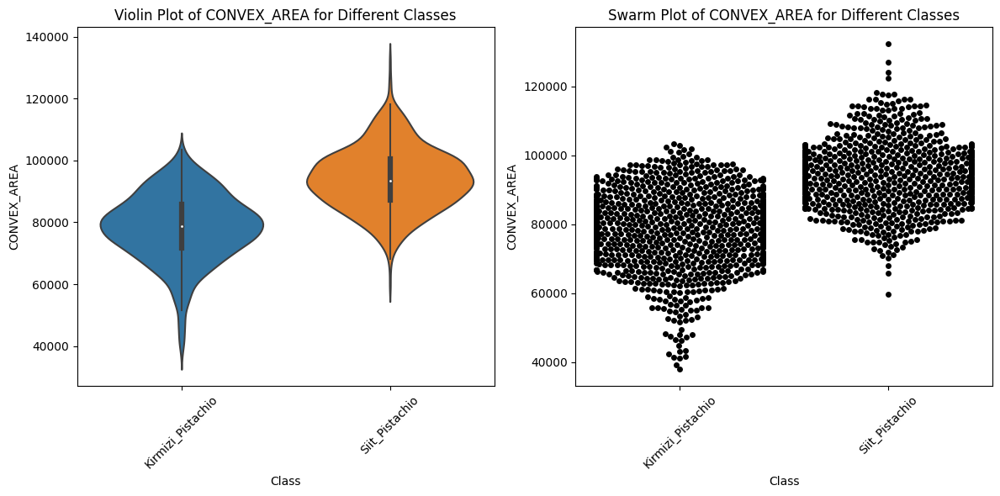

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 11.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 6.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 30.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 22.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


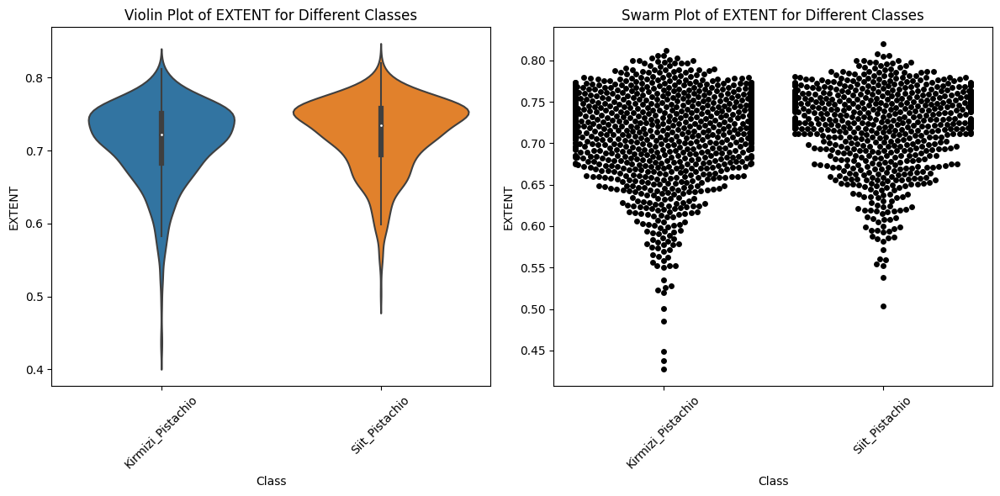

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 16.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 9.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 37.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 27.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


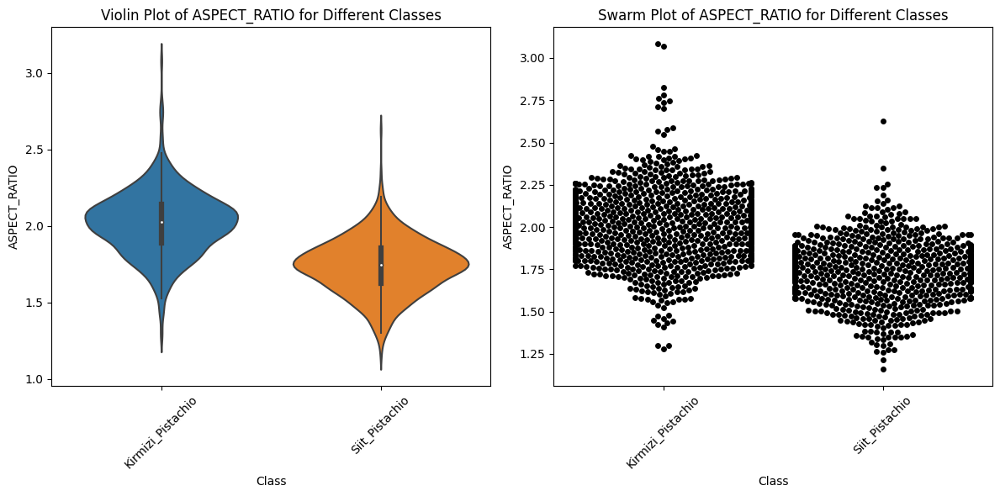

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 14.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 7.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


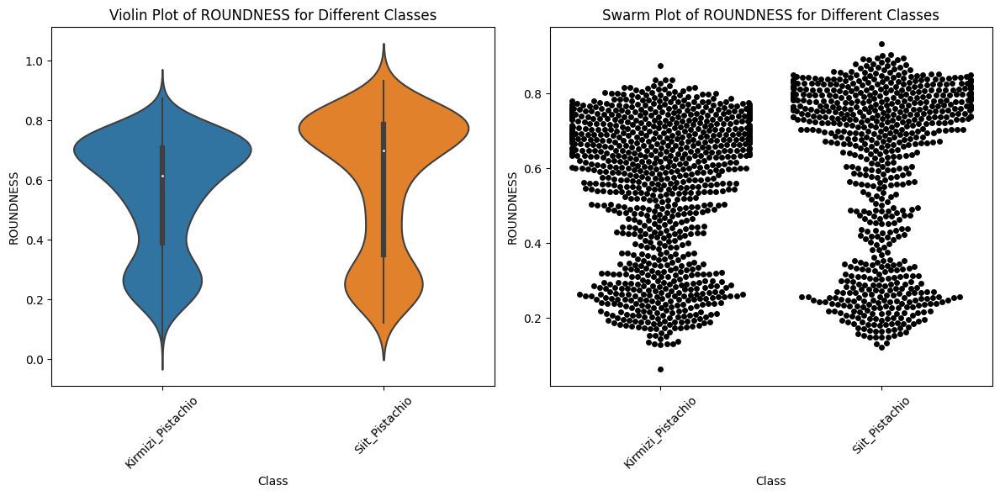

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 27.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 10.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 47.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 29.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


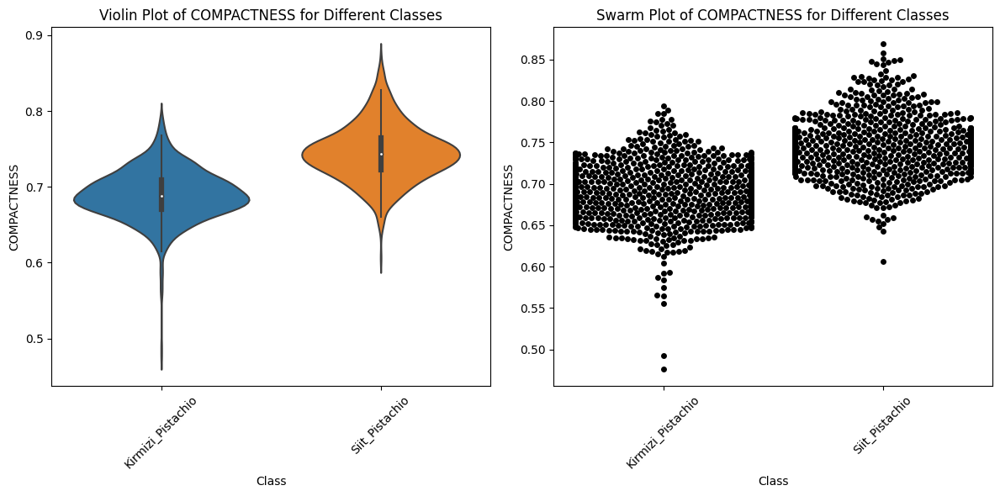

In [ ]:
# Define the list of geometric measurements
geometric_columns = [
    "AREA", "PERIMETER", "MAJOR_AXIS", "MINOR_AXIS",
    "ECCENTRICITY", "EQDIASQ", "SOLIDITY", "CONVEX_AREA",
    "EXTENT", "ASPECT_RATIO", "ROUNDNESS", "COMPACTNESS"
]

# Loop through each geometric measurement and create violin plots and swarm plots
for column in geometric_columns:
    plt.figure(figsize=(12, 6))

    # Violin Plot
    plt.subplot(1, 2, 1)
    sns.violinplot(x="Class", y=column, data=df)
    plt.title(f"Violin Plot of {column} for Different Classes")
    plt.xticks(rotation=45)

    # Swarm Plot
    plt.subplot(1, 2, 2)
    sns.swarmplot(x="Class", y=column, data=df, dodge=True, color='black')
    plt.title(f"Swarm Plot of {column} for Different Classes")
    plt.xticks(rotation=45)

    plt.tight_layout()
    plt.show()


##5. **Visualization of Shapes**: Use data visualization techniques to visualize the shapes based on their geometric measurements.

"Visualization of Shapes" involves using data visualization techniques to represent and display the characteristics of shapes based on their geometric measurements. This process helps in understanding the relationships between different measurements and provides insights into the shapes' features, differences, and patterns. Visualizations can range from simple plots to more complex representations of shape data.

The provided code snippet demonstrates how to perform dimensionality reduction using Principal Component Analysis (PCA) and visualize shapes based on the PCA components.

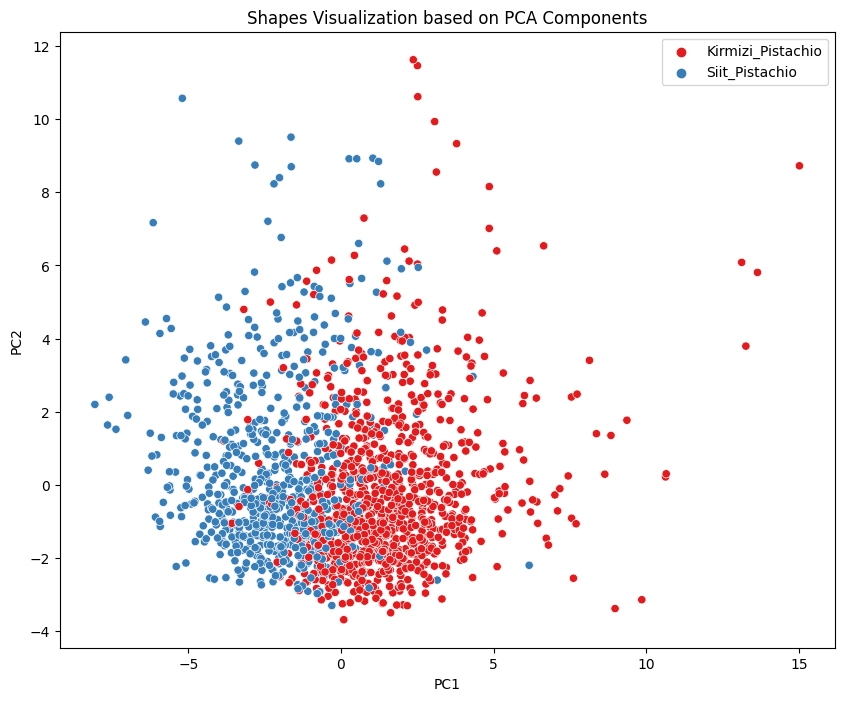

In [ ]:
# Split features and target variable
#The code separates the features (geometric measurements) from the target variable ("Class") by using the .drop() method.
#The result is stored in the variable X.
X = df.drop("Class", axis=1)

# Standardize the feature values
#The feature values are standardized using the StandardScaler() to have zero mean and unit variance.
#This is important when using PCA to ensure that all features are on similar scales.
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Apply PCA for dimensionality reduction
#PCA is applied to reduce the dimensionality of the data.
#The PCA() class is initialized with n_components=2 to reduce the data to two principal components for visualization.
#The fit_transform() method is used to perform the transformation and reduce the feature space to the new principal component space.
pca = PCA(n_components=2)  # Reduce to 2 dimensions for visualization
X_pca = pca.fit_transform(X_scaled)

# Add the Class column back to the PCA-transformed data
#The transformed data is stored in a DataFrame X_pca_df, containing the two principal components ("PC1" and "PC2").
#The original "Class" column from the original DataFrame df is added back to this DataFrame.
X_pca_df = pd.DataFrame(X_pca, columns=["PC1", "PC2"])
X_pca_df["Class"] = df["Class"]

# Create a scatter plot to visualize shapes based on PCA components
plt.figure(figsize=(10, 8))
sns.scatterplot(x="PC1", y="PC2", hue="Class", data=X_pca_df, palette="Set1")
plt.title("Shapes Visualization based on PCA Components")
plt.legend()
plt.show()


To visualize the shapes based on their geometric measurements in the "pistachio.csv" dataset, use dimensionality reduction techniques like Principal Component Analysis (PCA) to project the data into a lower-dimensional space and then visualize it.

In this code, Feature scaling is performed to standardize the feature values.
PCA is applied to reduce the data to 2 dimensions for visualization.
The transformed data with PCA components and the original class labels are combined.
A scatter plot is created using Seaborn to visualize shapes based on the two PCA components.

Certainly, another way to visualize the shapes based on their geometric measurements is by using t-SNE (t-distributed Stochastic Neighbor Embedding), a technique commonly used for visualizing high-dimensional data in a lower-dimensional space while preserving local structures.
In this code, Feature scaling is performed to standardize the feature values.
t-SNE is applied to reduce the data to 2 dimensions for visualization.
The transformed data with t-SNE components and the original class labels are combined.
A scatter plot is created using Seaborn to visualize shapes based on the two t-SNE components.
The scatter plot will show the shapes distributed in a 2D space based on their geometric measurements, with local structures preserved as much as possible. Adjust the perplexity parameter to control the balance between preserving local vs. global structures. Make sure you have the required libraries (pandas, matplotlib, scikit-learn, and seaborn) installed to run this code.


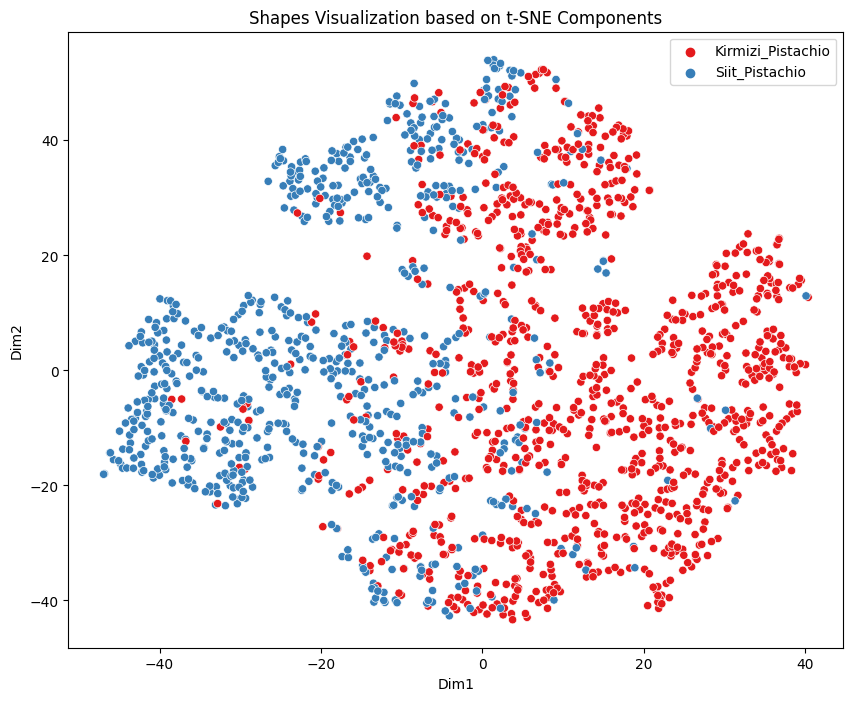

In [ ]:
# Split features and target variable
#The code separates the features (geometric measurements) from the target variable ("Class") by using the .drop() method.
#The result is stored in the variable X.
X = df.drop("Class", axis=1)

# Standardize the feature values
#The feature values are standardized using the StandardScaler() to have zero mean and unit variance.
#This is important when using t-SNE to ensure that all features are on similar scales.
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Apply t-SNE for dimensionality reduction
#t-SNE is applied to reduce the dimensionality of the data.
#The TSNE() class is initialized with n_components=2 to reduce the data to two t-SNE components for visualization.
#The perplexity parameter controls the balance between preserving global and local structures in the data.
#The random_state parameter is set for reproducibility. The fit_transform() method is used to perform the transformation.
tsne = TSNE(n_components=2, perplexity=30, random_state=42)
X_tsne = tsne.fit_transform(X_scaled)

# Add the Class column back to the t-SNE-transformed data
#The transformed data is stored in a DataFrame X_tsne_df, containing the two t-SNE components ("Dim1" and "Dim2").
#The original "Class" column from the original DataFrame df is added back to this DataFrame.
X_tsne_df = pd.DataFrame(X_tsne, columns=["Dim1", "Dim2"])
X_tsne_df["Class"] = df["Class"]

# Create a scatter plot to visualize shapes based on t-SNE components
plt.figure(figsize=(10, 8))
sns.scatterplot(x="Dim1", y="Dim2", hue="Class", data=X_tsne_df, palette="Set1")
plt.title("Shapes Visualization based on t-SNE Components")
plt.legend()
plt.show()


##6. **Dimensionality Reduction**: Apply dimensionality reduction techniques to visualize high - dimensional geometric data in lower-dimensional space.

To visualize high-dimensional geometric data from the "pistachio.csv" dataset in a lower-dimensional space, apply dimensionality reduction techniques such as t-SNE (t-distributed Stochastic Neighbor Embedding) and PCA (Principal Component Analysis).
In this code, Feature scaling is performed to standardize the feature values.
t-SNE is applied to reduce the data to 2 dimensions for visualization.
PCA is applied to reduce the data to 2 dimensions for visualization.
Subplots are used to create side-by-side visualizations of t-SNE and PCA results.
Seaborn is used to create scatter plots that display the data points in the lower-dimensional space with color-coded class labels.
Both t-SNE and PCA visualizations will show you how the high-dimensional geometric data is projected into a 2D space, helping you explore patterns, clusters, and relationships between different classes.

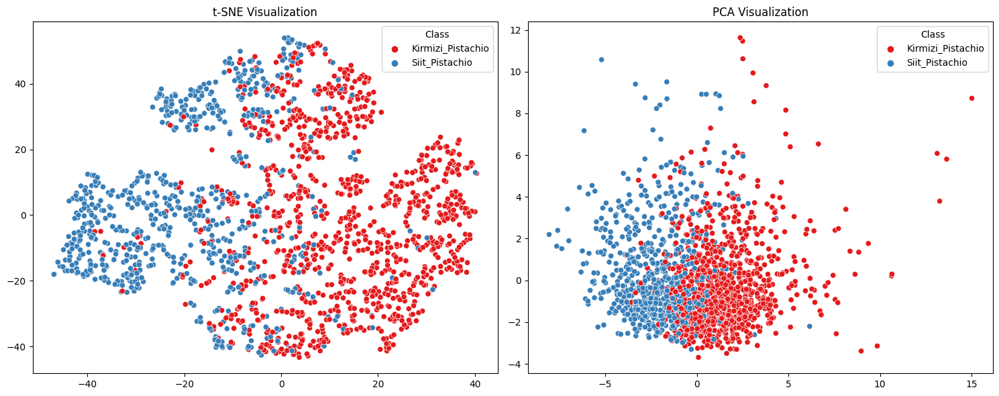

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

# Split features and target variable
X = df.drop("Class", axis=1)

# Standardize the feature values
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Apply t-SNE for dimensionality reduction
tsne = TSNE(n_components=2, perplexity=30, random_state=42)
X_tsne = tsne.fit_transform(X_scaled)

# Apply PCA for dimensionality reduction
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

# Create subplots for t-SNE and PCA visualizations
plt.figure(figsize=(15, 6))

# t-SNE Visualization
plt.subplot(1, 2, 1)
sns.scatterplot(x=X_tsne[:, 0], y=X_tsne[:, 1], hue=df["Class"], palette="Set1")
plt.title("t-SNE Visualization")

# PCA Visualization
plt.subplot(1, 2, 2)
sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue=df["Class"], palette="Set1")
plt.title("PCA Visualization")

plt.tight_layout()
plt.show()


##7. **Comparative Analysis**: Compare the geometric properties of different classes of shapes.

Comparative analysis of geometric properties involves examining and contrasting the various measurements and characteristics of different classes of shapes. We have a dataset with geometric measurements of objects, and each object belongs to a particular class (or shape category). The goal of this analysis is to understand how the geometric properties differ between these classes and how they might contribute to class differentiation.

* This is a list that contains the names of the geometric measurements you want to analyze. Each measurement corresponds to a column in the dataset.

* The code then loops through each geometric measurement in the geometric_columns list.

* Inside the loop, there are two sections of code for creating two types of plots: box plots and violin plots.
* The loop iterates through each geometric measurement, creating comparative box plots and violin plots for each measurement. This allows you to visualize how the distribution of each measurement varies across different classes.

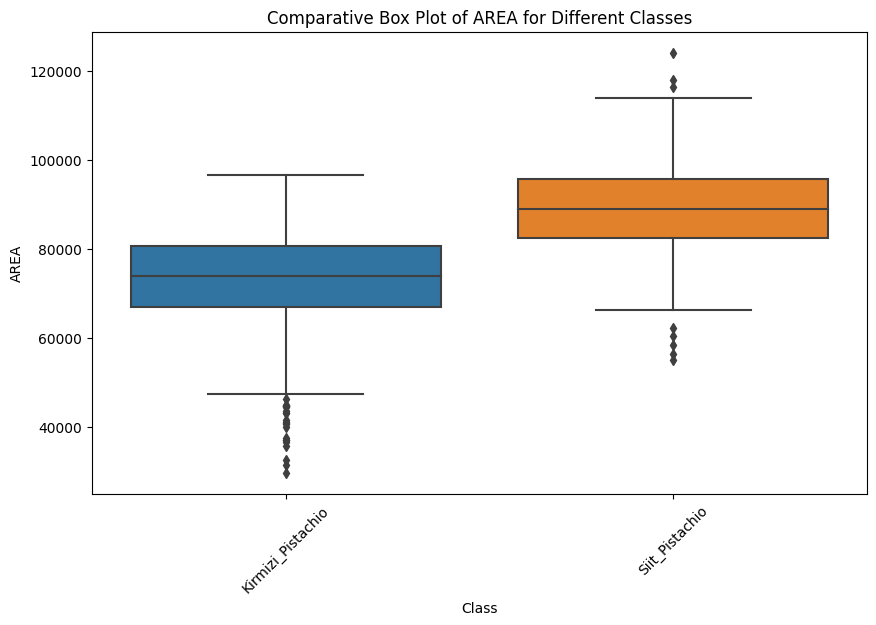

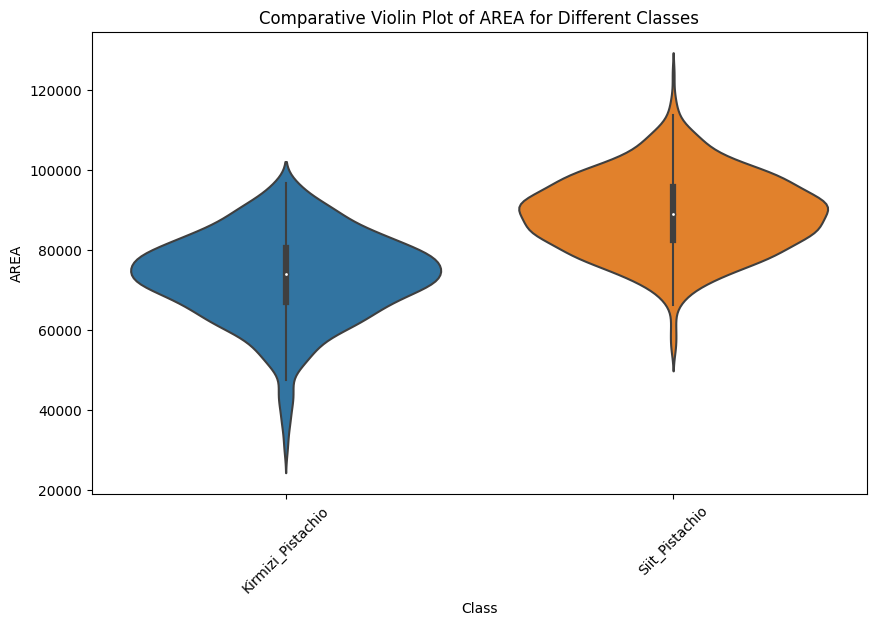

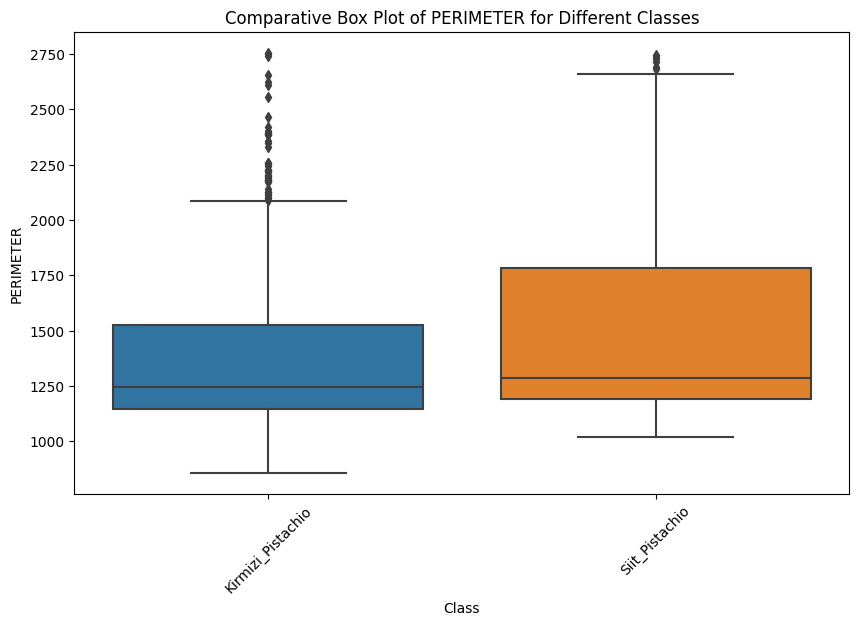

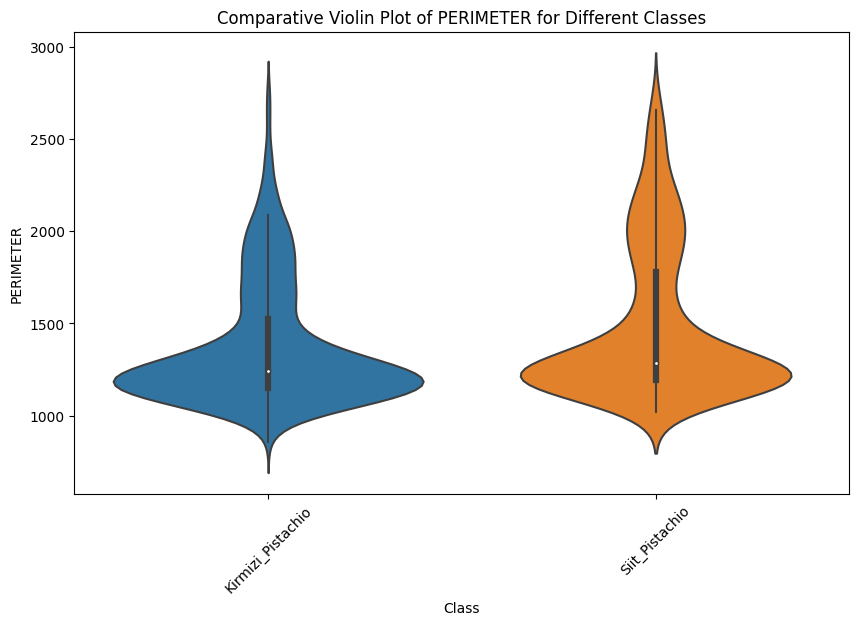

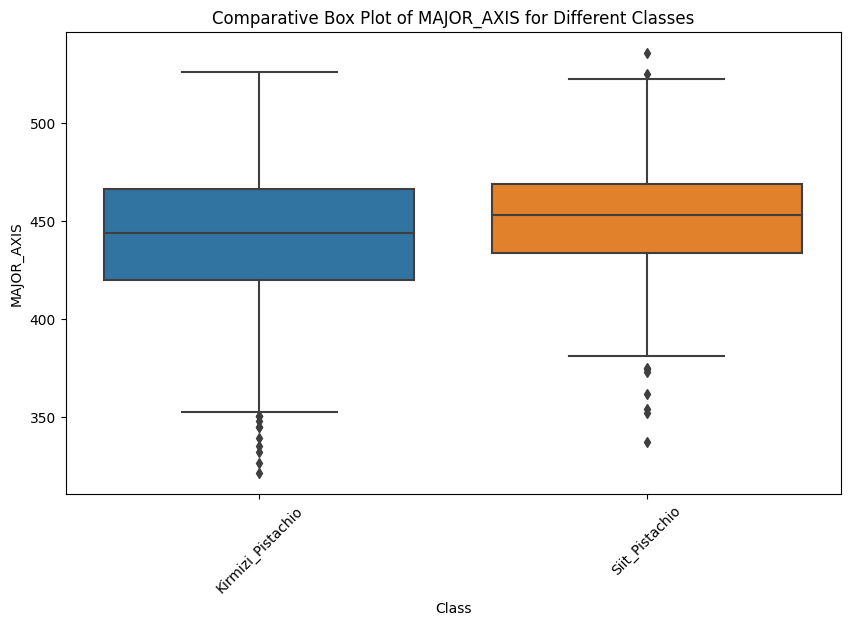

...

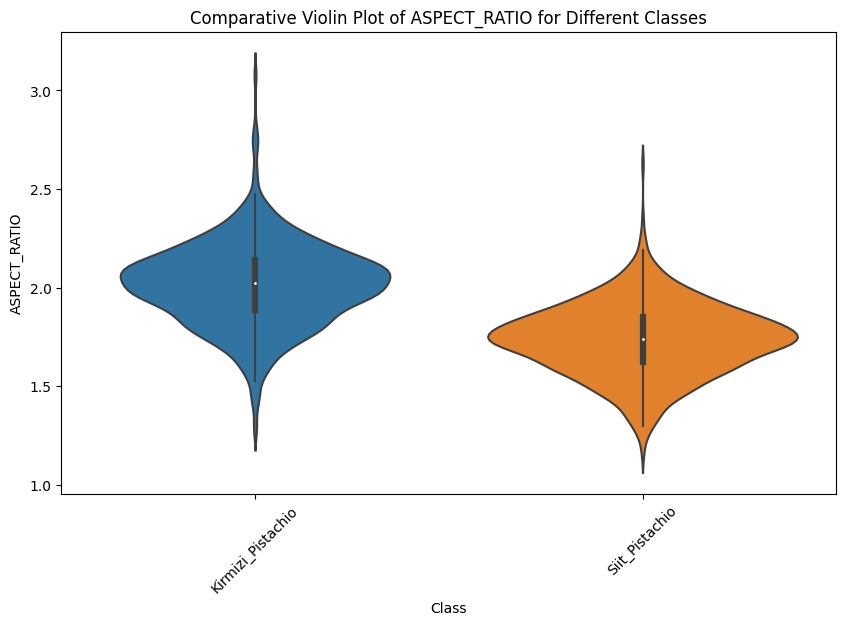

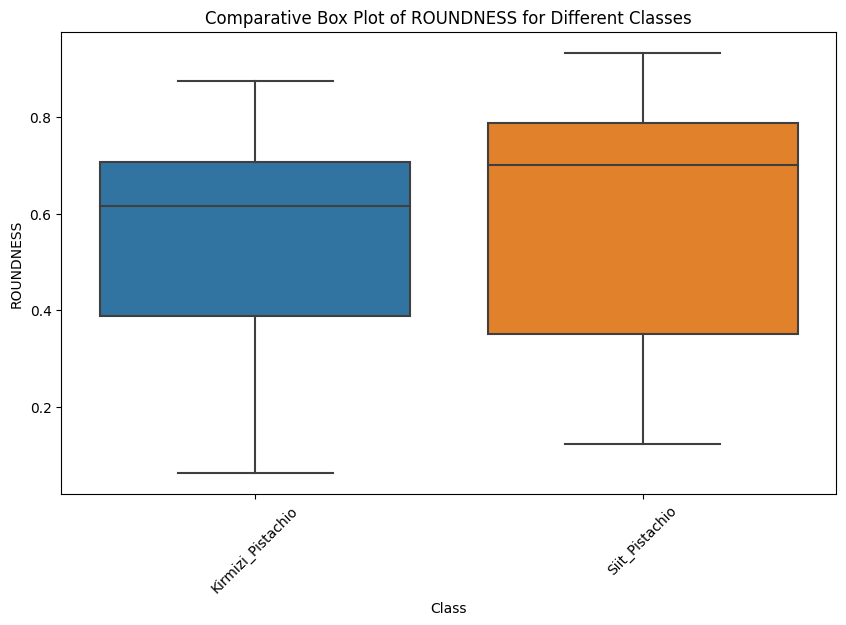

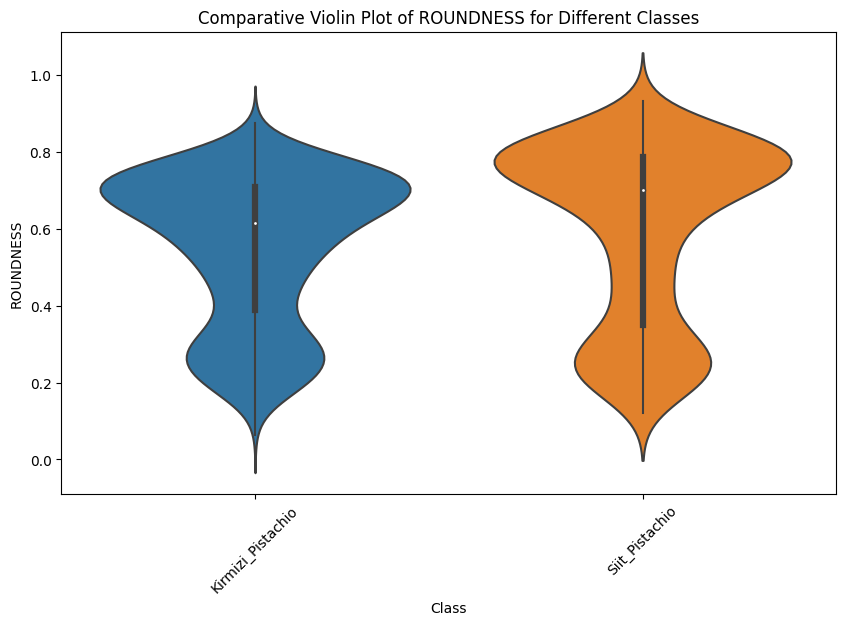

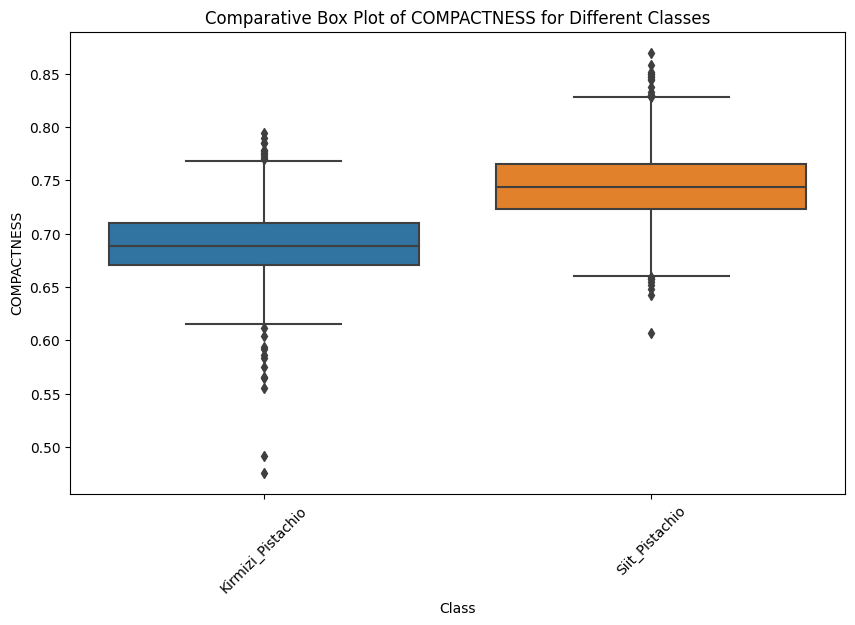

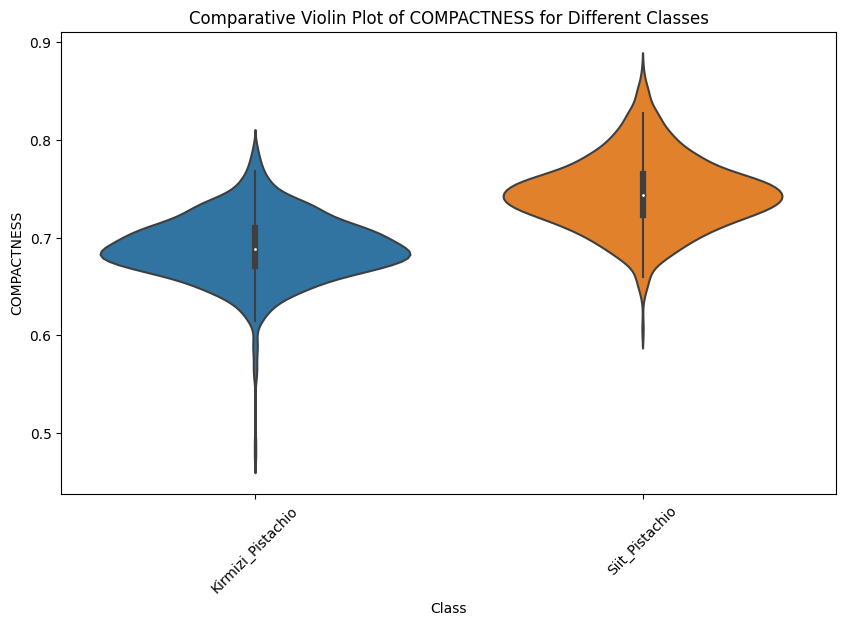

In [ ]:
# Define the list of geometric measurements
geometric_columns = [
    "AREA", "PERIMETER", "MAJOR_AXIS", "MINOR_AXIS",
    "ECCENTRICITY", "EQDIASQ", "SOLIDITY", "CONVEX_AREA",
    "EXTENT", "ASPECT_RATIO", "ROUNDNESS", "COMPACTNESS"
]

# Loop through each geometric measurement and create comparative plots
for column in geometric_columns:
    plt.figure(figsize=(10, 6))

    # Box Plot
    sns.boxplot(x="Class", y=column, data=df)
    plt.title(f"Comparative Box Plot of {column} for Different Classes")
    plt.xticks(rotation=45)
    plt.show()

    # Violin Plot
    plt.figure(figsize=(10, 6))
    sns.violinplot(x="Class", y=column, data=df)
    plt.title(f"Comparative Violin Plot of {column} for Different Classes")
    plt.xticks(rotation=45)
    plt.show()


##8. **Anomaly Detection**: Identify shapes that deviate significantly from the norm based on their geometric measurements.

Anomaly detection involves identifying data points that deviate significantly from the expected or "normal" behavior within a dataset. In the context of geometric measurements of shapes, anomaly detection would mean identifying shapes that have unusual or outlier-like properties compared to the rest of the shapes.

In summary, the code applies the DBSCAN clustering algorithm for anomaly detection on the standardized geometric measurements. It visualizes the clusters and anomalies in a scatter plot, where anomalies are marked in gray, and clusters are shown with different colors. The color assignment is determined by the unique labels assigned by the DBSCAN algorithm.

<ipython-input-12-a6178e2aa164>:29: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab20', len(unique_labels))


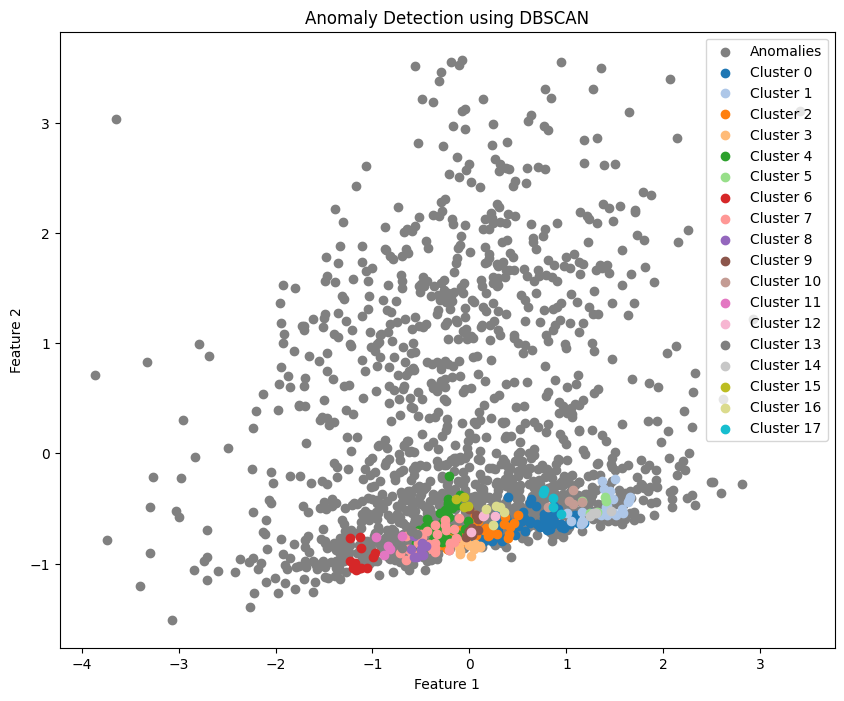

In [ ]:
from sklearn.preprocessing import StandardScaler #Import the StandardScaler class from scikit-learn for feature standardization.
from sklearn.cluster import DBSCAN # Import the DBSCAN class from scikit-learn for clustering and anomaly detection.


# Select only the geometric measurement columns
#A list containing the names of the geometric measurements you want to analyze.
geometric_columns = [
    "AREA", "PERIMETER", "MAJOR_AXIS", "MINOR_AXIS",
    "ECCENTRICITY", "EQDIASQ", "SOLIDITY", "CONVEX_AREA",
    "EXTENT", "ASPECT_RATIO", "ROUNDNESS", "COMPACTNESS"
]
X = df[geometric_columns] #Select the subset of columns specified by geometric_columns from the original DataFrame df.

# Standardize the feature values
scaler = StandardScaler() #Create an instance of the StandardScaler class for feature scaling.
X_scaled = scaler.fit_transform(X) #Apply standardization to the feature matrix X and store the scaled features in X_scaled.

# Apply DBSCAN for anomaly detection
#Create an instance of the DBSCAN class for clustering and anomaly detection.
#eps defines the maximum distance between samples within a cluster,
#and min_samples sets the minimum number of samples required to form a core point.
dbscan = DBSCAN(eps=0.5, min_samples=5)
#Fit the DBSCAN model to the scaled features and obtain cluster labels and anomaly labels for each data point.
labels = dbscan.fit_predict(X_scaled)

# Visualize anomalies
plt.figure(figsize=(10, 8))
#Get the unique labels (clusters and anomalies) present in the labels array.
unique_labels = np.unique(labels)
#Get a color map with a specified number of colors.
colors = plt.cm.get_cmap('tab20', len(unique_labels))

#oop through each unique label:
#If the label is -1 (anomalies), scatter plot those points in gray.
#For other labels (clusters), scatter plot points with colors corresponding to the label.
for label in unique_labels:
    if label == -1:
        plt.scatter(X_scaled[labels == label, 0], X_scaled[labels == label, 1], c='gray', label='Anomalies')
    else:
        plt.scatter(X_scaled[labels == label, 0], X_scaled[labels == label, 1], color=colors(label), label=f'Cluster {label}')

plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.title('Anomaly Detection using DBSCAN')
plt.legend()
plt.show()


##9. **Shape Similarity**: Measure the similarity or dissimilarity between different shapes based on their measurements.

To measure the similarity or dissimilarity between different shapes based on their measurements, you can use various distance metrics or similarity measures. One common metric is the Euclidean distance, which calculates the straight-line distance between two points in a multi-dimensional space. Here's a Python code example using the pandas library to load the dataset and calculate the Euclidean distance between shapes based on their measurements:
In this code, we load the dataset using pandas, extract the columns containing shape measurements, and then calculate the Euclidean distance matrix using the euclidean_distances function from sklearn.metrics.pairwise.


In summary, this code calculates the pairwise Euclidean distances between data points using the selected geometric measurement columns. The resulting distance matrix provides a quantitative measure of the dissimilarity between data points in terms of their geometric properties. This can be useful for various purposes, such as clustering, dimensionality reduction, and anomaly detection.

In [ ]:
#This function computes the pairwise Euclidean distances between samples in two datasets.
from sklearn.metrics.pairwise import euclidean_distances



# Select columns containing measurements
#A list containing the names of the columns that store the geometric measurements you want to analyze.
measurement_columns = ['AREA', 'PERIMETER', 'MAJOR_AXIS', 'MINOR_AXIS', 'ECCENTRICITY',
                       'EQDIASQ', 'SOLIDITY', 'CONVEX_AREA', 'EXTENT', 'ASPECT_RATIO',
                       'ROUNDNESS', 'COMPACTNESS', 'SHAPEFACTOR_1', 'SHAPEFACTOR_2',
                       'SHAPEFACTOR_3', 'SHAPEFACTOR_4']

# Extract the measurement data
#Extract the data corresponding to the selected geometric measurement columns from the DataFrame df.
#This creates a subset of the original dataset containing only the specified measurements.
measurement_data = df[measurement_columns]

# Calculate the Euclidean distance matrix
#Calculate the pairwise Euclidean distances between all data points in the measurement_data matrix.
#The result is symmetric matrix where each element (i, j) represents Euclidean distance between i-th and j-th rows of measurement_data matrix.
euclidean_distance_matrix = euclidean_distances(measurement_data)

# Display the Euclidean distance matrix
#Print the computed Euclidean distance matrix.
#This matrix provides insights into how similar or dissimilar pairs of data points are based on the selected geometric measurements.
#Lower values in the matrix indicate more similar data points, while higher values indicate more dissimilarity.
print(euclidean_distance_matrix)


[[    0.         22065.36273429 17927.27669973 ... 22972.33135157
    462.18948886  8914.92190802]
 [22065.36273429     0.         39962.7376218  ...  1047.9775177
  21741.62165491 13282.71305883]
 [17927.27669973 39962.7376218      0.         ... 40850.30713205
  18278.78089557 26832.92330267]
 ...
 [22972.33135157  1047.9775177  40850.30713205 ...     0.
  22653.71918347 14229.07498003]
 [  462.18948886 21741.62165491 18278.78089557 ... 22653.71918347
      0.          8555.38709471]
 [ 8914.92190802 13282.71305883 26832.92330267 ... 14229.07498003
   8555.38709471     0.        ]]


**Cosine Similarity:**
Cosine similarity measures the cosine of the angle between two vectors. It's commonly used for text analysis and can also be applied to your dataset of shape measurements.

* Cosine similarity is a measure of the cosine of the angle between two vectors. It ranges from -1 to 1, where a value of 1 indicates that the vectors are pointing in the same direction (i.e., they are very similar), 0 indicates that the vectors are orthogonal (i.e., they are not similar), and -1 indicates that the vectors are pointing in opposite directions (i.e., they are dissimilar).

* In summary, this code calculates the pairwise cosine similarity between data points using the selected geometric measurement columns. The resulting similarity matrix provides a quantitative measure of the similarity between data points in terms of their geometric properties. This can be useful for various purposes, such as clustering, dimensionality reduction, and similarity-based analysis.

In [ ]:

from sklearn.metrics.pairwise import cosine_similarity

# Select columns containing measurements
measurement_columns = ['AREA', 'PERIMETER', 'MAJOR_AXIS', 'MINOR_AXIS', 'ECCENTRICITY',
                       'EQDIASQ', 'SOLIDITY', 'CONVEX_AREA', 'EXTENT', 'ASPECT_RATIO',
                       'ROUNDNESS', 'COMPACTNESS', 'SHAPEFACTOR_1', 'SHAPEFACTOR_2',
                       'SHAPEFACTOR_3', 'SHAPEFACTOR_4']

# Extract the measurement data
measurement_data = df[measurement_columns]

# Calculate the cosine similarity matrix
#Calculate the pairwise cosine similarity between all data points in the measurement_data matrix.
#The result is a symmetric matrix where each element (i, j) represents cosine similarity between i-th and j-th rows of measurement_data matrix.
cosine_similarity_matrix = cosine_similarity(measurement_data)

# Display the cosine similarity matrix
print(cosine_similarity_matrix)


[[1.         0.99993344 0.99999741 ... 0.99987796 0.99999591 0.99998691]
 [0.99993344 1.         0.99995494 ... 0.99999001 0.99989826 0.99986172]
 [0.99999741 0.99995494 1.         ... 0.99990923 0.99998834 0.99997333]
 ...
 [0.99987796 0.99999001 0.99990923 ... 1.         0.99983409 0.99978575]
 [0.99999591 0.99989826 0.99998834 ... 0.99983409 1.         0.99999628]
 [0.99998691 0.99986172 0.99997333 ... 0.99978575 0.99999628 1.        ]]


**Manhattan Distance:**
Manhattan distance, also known as the L1 distance, calculates the absolute difference between corresponding components of two vectors.

In summary, this code calculates the pairwise Manhattan distances between data points using the selected geometric measurement columns. The resulting distance matrix provides a quantitative measure of the distances between data points in terms of their geometric properties. This can be useful for various purposes, such as clustering, dimensionality reduction, and distance-based analysis.

In [ ]:
import pandas as pd
from sklearn.metrics.pairwise import manhattan_distances

# Load the dataset
data = pd.read_csv('pistachio.csv')

# Select columns containing measurements
measurement_columns = ['AREA', 'PERIMETER', 'MAJOR_AXIS', 'MINOR_AXIS', 'ECCENTRICITY',
                       'EQDIASQ', 'SOLIDITY', 'CONVEX_AREA', 'EXTENT', 'ASPECT_RATIO',
                       'ROUNDNESS', 'COMPACTNESS', 'SHAPEFACTOR_1', 'SHAPEFACTOR_2',
                       'SHAPEFACTOR_3', 'SHAPEFACTOR_4']

# Extract the measurement data
measurement_data = data[measurement_columns]

# Calculate the Manhattan distance matrix
#Calculate the pairwise Manhattan distances between all data points in the measurement_data matrix.
#The result is a symmetric matrix where each element (i, j) represents Manhattan distance between i-th and j-th rows of measurement_data matrix.
manhattan_distance_matrix = manhattan_distances(measurement_data)

# Display the Manhattan distance matrix
print(manhattan_distance_matrix)


[[    0.     31280.0239 25584.036  ... 32740.1487   660.8119 12753.8799]
 [31280.0239     0.     56863.2871 ...  1496.0896 30930.1958 18829.9896]
 [25584.036  56863.2871     0.     ... 58296.6589 26227.5423 38337.4215]
 ...
 [32740.1487  1496.0896 58296.6589 ...     0.     32152.5022 20004.8862]
 [  660.8119 30930.1958 26227.5423 ... 32152.5022     0.     12147.6756]
 [12753.8799 18829.9896 38337.4215 ... 20004.8862 12147.6756     0.    ]]


We can try both cosine similarity and Manhattan distance matrices and analyze which one provides more meaningful insights for your specific use case of measuring the similarity or dissimilarity between different shapes based on their measurements.

**Manhattan Distance Matrix:**

* The Manhattan distance (L1 distance) is the sum of the absolute differences between corresponding elements of two vectors.
* Larger values in the Manhattan distance matrix indicate greater dissimilarity between shapes.
* Smaller values indicate greater similarity between shapes.
* In the output, the values in the matrix are relatively large, ranging from a few thousand to tens of thousands.
The matrix shows that the shapes have varying degrees of dissimilarity based on their geometric measurements.
The Manhattan distance is sensitive to differences in individual measurements, so shapes with similar overall characteristics but differing in some measurements may have relatively high distances.

**Cosine Similarity Matrix:**

* Cosine similarity measures the cosine of the angle between two vectors. It ranges from -1 to 1.
* Larger values in the cosine similarity matrix indicate greater similarity between shapes.
* Positive values indicate similarity, while negative values indicate dissimilarity (opposite directions).
* In the output, the values in the matrix are very close to 1, indicating high similarity.
* The matrix shows that the shapes have high similarity based on their geometric measurements.
* The cosine similarity is less sensitive to the magnitude of individual measurements and more sensitive to the overall trend of the measurements.

**Analysis and Interpretation:**
Based on the output and the characteristics of the metrics:

* The Manhattan distance matrix emphasizes differences between individual measurements and may be more useful when you're interested in understanding how specific measurements contribute to overall dissimilarity.
* The cosine similarity matrix emphasizes the overall trend and pattern of measurements and may be more useful when you're interested in identifying shapes that share similar overall geometric characteristics.


-> Ultimately, the choice between these metrics depends on specific goals and the nature of analysis. If interested in capturing overall similarity while being less sensitive to variations in individual measurements, cosine similarity might be more suitable. If interested in capturing dissimilarities driven by differences in individual measurements, Manhattan distance might be more informative.

##10. **Clustering Analysis**: Use clustering algorithms to group similar shapes together based on their geometric properties.

Clustering analysis is a data exploration technique that involves grouping similar data points together into clusters or clusters. In the context of the dataset with geometric measurements of shapes, clustering algorithms aim to group shapes that share similar geometric properties. This process can help to discover inherent patterns, similarities, and differences among the shapes without needing predefined class labels.

Clustering algorithms can help to group similar shapes together based on their geometric properties. Here, we'll demonstrate how to use the KMeans clustering algorithm from the sklearn.cluster module.

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


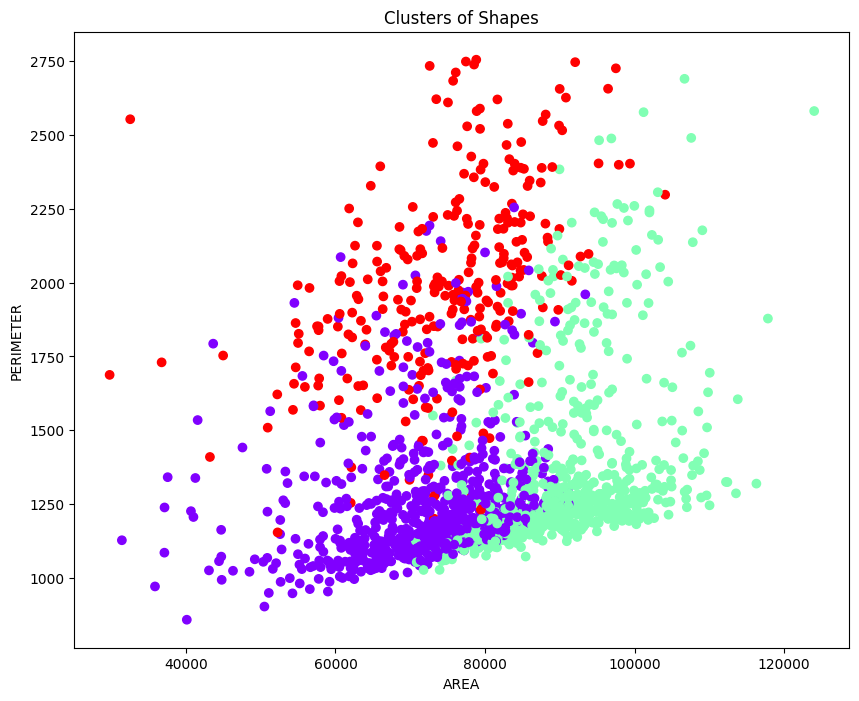

In [ ]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
# Select columns containing measurements
measurement_columns = ['AREA', 'PERIMETER', 'MAJOR_AXIS', 'MINOR_AXIS', 'ECCENTRICITY',
                       'EQDIASQ', 'SOLIDITY', 'CONVEX_AREA', 'EXTENT', 'ASPECT_RATIO',
                       'ROUNDNESS', 'COMPACTNESS', 'SHAPEFACTOR_1', 'SHAPEFACTOR_2',
                       'SHAPEFACTOR_3', 'SHAPEFACTOR_4']

# Extract the measurement data
measurement_data = df[measurement_columns]

# Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(measurement_data)

# Choose the number of clusters (you need to decide on this based on your problem)
# Choose the desired number of clusters.
#In this example, num_clusters is set to 3, but you should adjust this based on your problem and experimentation.
num_clusters = 3

# Apply KMeans clustering
#Create an instance of the KMeans class with the specified number of clusters and a fixed random state for reproducibility.
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
#Fit the KMeans model to the scaled data and obtain cluster labels for each data point.
cluster_labels = kmeans.fit_predict(scaled_data)

# Add cluster labels to the original data
#Add the cluster labels obtained from KMeans as a new column named 'Cluster' to the original DataFrame df.
df['Cluster'] = cluster_labels

# Visualize the clusters using a scatter plot of two chosen features
feature1 = 'AREA'
feature2 = 'PERIMETER'
plt.figure(figsize=(10, 8))
plt.scatter(data[feature1], data[feature2], c=cluster_labels, cmap='rainbow')
plt.xlabel(feature1)
plt.ylabel(feature2)
plt.title('Clusters of Shapes')
plt.show()


In this example, I've used the KMeans clustering algorithm to group shapes based on the 'AREA' and 'PERIMETER' features. You can replace 'feature1' and 'feature2' with any other combination of features to visualize the clusters using different dimensions. Additionally, you should experiment with the number of clusters to find the most meaningful grouping for your dataset.

Remember that clustering results might not always be perfect, and you might need to fine-tune parameters or try different algorithms to achieve the desired groupings.

##11. **Shape Transformation**: Analyze how different transformations (e.g., rotation, scaling) affect the geometric measurements and class predictions.

##12. **Model Evaluation**: Evaluate the performance of classification models using appropriate metrics.

Model evaluation is a crucial step in machine learning that involves assessing the performance of your trained classification models. The goal is to understand how well your model is performing on unseen data and to make informed decisions about model selection, tuning, and deployment. The choice of evaluation metrics depends on the nature of your problem and the specific goals you want to achieve.

In [ ]:
import pandas as pd
import numpy as np
#Import the train_test_split function for splitting the dataset into training and testing sets.
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
#Import various metrics for evaluating classification models.
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

# Calculate evaluation metrics
#Calculate the accuracy score by comparing the true labels y_test with the predicted labels predictions.
accuracy = accuracy_score(y_test, predictions)
#Calculate the precision score by comparing the true labels y_test with the predicted labels predictions.
#The pos_label parameter specifies the positive class label.
precision = precision_score(y_test, predictions, pos_label='Kirmizi_Pistachio')
#Calculate the recall score by comparing the true labels y_test with the predicted labels predictions.
#The pos_label parameter specifies the positive class label.
recall = recall_score(y_test, predictions, pos_label='Kirmizi_Pistachio')
#Calculate the F1-score by comparing the true labels y_test with the predicted labels predictions.
#The pos_label parameter specifies the positive class label.
f1 = f1_score(y_test, predictions, pos_label='Kirmizi_Pistachio')
#Compute the confusion matrix by comparing the true labels y_test with the predicted labels predictions.
conf_matrix = confusion_matrix(y_test, predictions)

# Print the evaluation metrics
print(f"Accuracy: {accuracy:.2f}")
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1-Score: {f1:.2f}")
print("Confusion Matrix:")
print(conf_matrix)


Accuracy: 0.88
Precision: 0.90
Recall: 0.90
F1-Score: 0.90
Confusion Matrix:
[[180  21]
 [ 19 124]]


In summary, this code calculates and prints various evaluation metrics for a classification model. The metrics include accuracy, precision, recall, and F1-score, along with the confusion matrix. These metrics provide insights into how well the model is performing in terms of correct predictions, false positives, false negatives, and other aspects of classification performance.

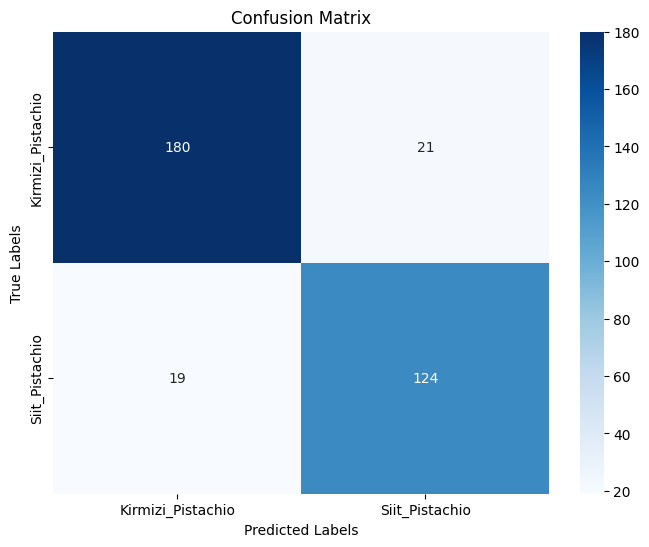

In [ ]:
# Create a heatmap of the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=model.classes_, yticklabels=model.classes_)
plt.title("Confusion Matrix")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

##13. **Validation and Testing**: Split the dataset into training and testing sets to validate the models.

Validation and testing are essential steps in the machine learning pipeline that involve splitting your dataset into subsets to assess the performance of your models. These subsets help you evaluate how well your models generalize to new, unseen data. The two primary subsets used for this purpose are the training set and the testing set.

In summary, this code loads a dataset containing pistachio measurements, selects the relevant measurement columns and class labels, and then splits the data into training and testing sets using the train_test_split function. Finally, it prints the sizes of the training and testing sets to give you an idea of how the data is partitioned for model training and evaluation.

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split

# Load the pistachio dataset
data = pd.read_csv('pistachio.csv')

# Select columns containing measurements
measurement_columns = ['AREA', 'PERIMETER', 'MAJOR_AXIS', 'MINOR_AXIS', 'ECCENTRICITY',
                       'EQDIASQ', 'SOLIDITY', 'CONVEX_AREA', 'EXTENT', 'ASPECT_RATIO',
                       'ROUNDNESS', 'COMPACTNESS', 'SHAPEFACTOR_1', 'SHAPEFACTOR_2',
                       'SHAPEFACTOR_3', 'SHAPEFACTOR_4']

# Extract the measurement data and class labels
#Extract the data corresponding to the selected geometric measurement columns from the DataFrame data.
#This creates a subset of the dataset containing only the specified measurements.
X = data[measurement_columns]
#Extract the class labels from the 'Class' column of the DataFrame data.
#These labels represent the categories associated with each shape.
y = data['Class']

# Split the data into training and testing sets
#Use the train_test_split function to split the data into training and testing sets. The arguments are as follows:
#X: The feature data (geometric measurements).
#y: The target data (class labels).
#test_size: The proportion of data to allocate to the testing set. In this case, 20% of the data is allocated for testing.
#random_state: A seed for the random number generator to ensure reproducibility.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Print the sizes of training and testing sets
print(f"Training set size: {X_train.shape[0]} samples")
print(f"Testing set size: {X_test.shape[0]} samples")


Training set size: 1374 samples
Testing set size: 344 samples


## 14. **Feature Engineering**: Explore creating new features or combinations of features to improve model performance.

Feature engineering is a crucial process in machine learning that involves transforming and creating new features from the existing raw data to improve the performance of a model. The goal of feature engineering is to extract relevant information, highlight important patterns, and provide the model with more meaningful input. Well-engineered features can lead to better model accuracy, robustness, and generalization to new data.

In summary, feature engineering is the art of transforming and creating features to enhance the quality of input data for machine learning models. It requires a deep understanding of the problem domain, creativity, and experimentation to discover features that unlock the full potential of your models.

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

# Select columns containing measurements
measurement_columns = ['AREA', 'PERIMETER', 'MAJOR_AXIS', 'MINOR_AXIS', 'ECCENTRICITY',
                       'EQDIASQ', 'SOLIDITY', 'CONVEX_AREA', 'EXTENT', 'ASPECT_RATIO',
                       'ROUNDNESS', 'COMPACTNESS', 'SHAPEFACTOR_1', 'SHAPEFACTOR_2',
                       'SHAPEFACTOR_3', 'SHAPEFACTOR_4']

# Extract the measurement data and class labels
X = df[measurement_columns]
y = df['Class']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create new features by combining existing ones
#Create a new feature named 'PERIMETER_TO_AREA' by dividing the 'PERIMETER' feature by the 'AREA' feature for the training set.
X_train['PERIMETER_TO_AREA'] = X_train['PERIMETER'] / X_train['AREA']
#Create the same new feature for the testing set.
X_test['PERIMETER_TO_AREA'] = X_test['PERIMETER'] / X_test['AREA']

# Preprocess the data
#Create an instance of the StandardScaler class for feature scaling.
preprocessor = StandardScaler()
#Apply the standardization to the training set features and store the scaled features in X_train_preprocessed.
X_train_preprocessed = preprocessor.fit_transform(X_train)
#Apply the same standardization to the testing set features and store the scaled features in X_test_preprocessed.
X_test_preprocessed = preprocessor.transform(X_test)

# Train the model
#Create an instance of the LogisticRegression class with specified hyperparameters, such as max_iter (maximum number of iterations) and random_state (for reproducibility).
model = LogisticRegression(max_iter=1000, random_state=42)
#Train the logistic regression model using the preprocessed training set features X_train_preprocessed and the corresponding target labels y_train.
model.fit(X_train_preprocessed, y_train)

# Predict and evaluate
#Use the trained model to make predictions on the preprocessed testing set features X_test_preprocessed.
predictions = model.predict(X_test_preprocessed)
# Calculate the accuracy score by comparing the true labels y_test with the predicted labels predictions.
accuracy = accuracy_score(y_test, predictions)
print(f"Accuracy with new features: {accuracy:.2f}")


Accuracy with new features: 0.88


In summary, this code demonstrates feature engineering by creating a new feature that represents the ratio of perimeter to area for each shape. The dataset is split into training and testing sets, and the logistic regression model is trained and evaluated on the preprocessed data. The new feature is used to potentially enhance the model's performance, and the resulting accuracy is printed.

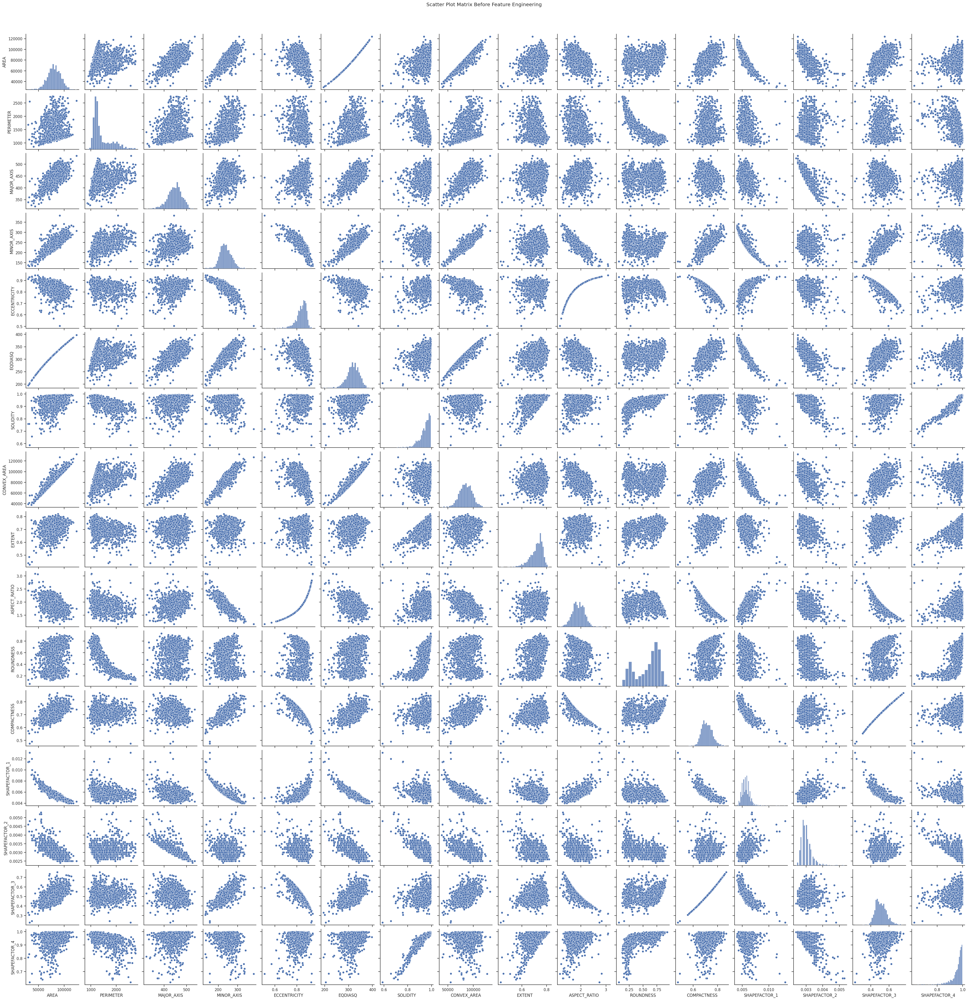

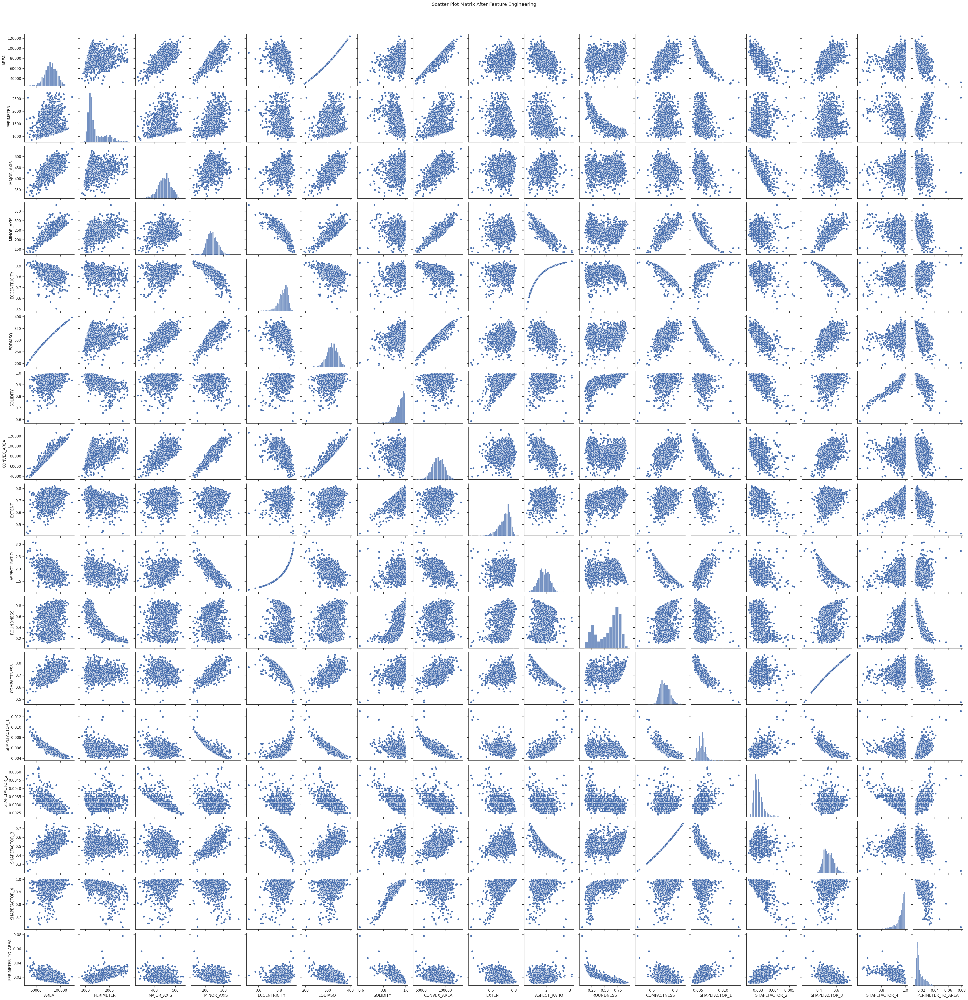

In [ ]:
# Extract the measurement data and class labels
X = data[measurement_columns]
y = data['Class']

# Create scatter plot matrix before feature engineering
sns.set(style="ticks")
sns.pairplot(X[measurement_columns])
plt.suptitle("Scatter Plot Matrix Before Feature Engineering", y=1.02)
plt.show()

# Create a new feature
#Create a new feature named 'PERIMETER_TO_AREA' by dividing the 'PERIMETER' feature by the 'AREA' feature for all samples in the DataFrame X.
X['PERIMETER_TO_AREA'] = X['PERIMETER'] / X['AREA']

# Create scatter plot matrix after feature engineering
sns.set(style="ticks")
sns.pairplot(X)
plt.suptitle("Scatter Plot Matrix After Feature Engineering", y=1.02)
plt.show()


##15. **Model Interpretation**: Interpret the trained models to understand how different measurements contribute to the predicted class.

Model interpretation involves understanding and explaining how a trained machine learning model makes predictions based on input features. This process helps provide insights into the relationships between the features and the predicted outcomes, as well as understanding the importance of individual features in making predictions.

n summary, model interpretation is crucial for understanding how a trained model makes predictions based on different measurements. It involves techniques like feature importance, partial dependence plots, SHAP values, LIME, visualizations, and domain expertise. Interpreting models helps build trust in their predictions, identify influential features, and gain insights into the problem domain.

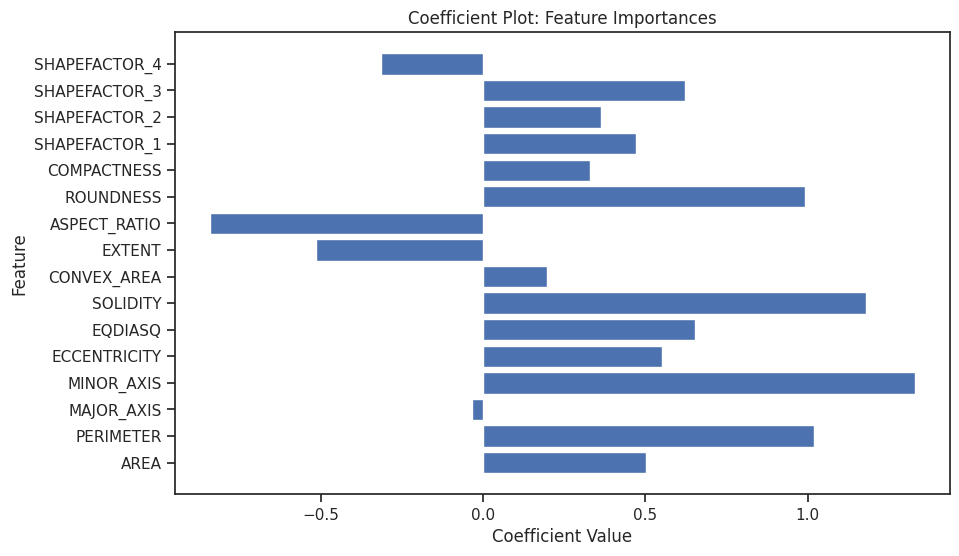

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
import matplotlib.pyplot as plt


# Select columns containing measurements
measurement_columns = ['AREA', 'PERIMETER', 'MAJOR_AXIS', 'MINOR_AXIS', 'ECCENTRICITY',
                       'EQDIASQ', 'SOLIDITY', 'CONVEX_AREA', 'EXTENT', 'ASPECT_RATIO',
                       'ROUNDNESS', 'COMPACTNESS', 'SHAPEFACTOR_1', 'SHAPEFACTOR_2',
                       'SHAPEFACTOR_3', 'SHAPEFACTOR_4']

# Extract the measurement data and class labels
X = df[measurement_columns]
y = df['Class']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Preprocess the data
#Create an instance of the StandardScaler class for feature scaling.
preprocessor = StandardScaler()
# Apply standardization to the training set features and store the scaled features in X_train_preprocessed.
X_train_preprocessed = preprocessor.fit_transform(X_train)
#Apply the same standardization to the testing set features and store the scaled features in X_test_preprocessed.
X_test_preprocessed = preprocessor.transform(X_test)

# Train the logistic regression model
#Create an instance of the LogisticRegression class with specified hyperparameters.
model = LogisticRegression(max_iter=1000, random_state=42)
#Train the logistic regression model using the preprocessed training set features X_train_preprocessed and the corresponding target labels y_train.
model.fit(X_train_preprocessed, y_train)

# Get the coefficients and feature names
#Obtain the coefficients associated with each feature from the trained logistic regression model.
coefficients = model.coef_[0]
# Store the names of the measurement features in the feature_names list.
feature_names = measurement_columns

# Create a coefficient plot
plt.figure(figsize=(10, 6))
plt.barh(feature_names, coefficients)
plt.xlabel('Coefficient Value')
plt.ylabel('Feature')
plt.title('Coefficient Plot: Feature Importances')
plt.show()


#**Summary/Conclusion:**

##**Project Title:**
*Pistachio Classification based on Geometric Object(Shape) Analysis using ML Algorithms*

##**Objective:**
The project aims to analyze and classify geometric shapes based on their measurements using machine learning techniques.

##**Project Steps:**

* **Data Loading and Exploration:**

Load the dataset from 'pistachio.csv' containing geometric measurements and class labels.
Explore the dataset's structure, summary statistics, and data distributions.

* **Data Preprocessing:**

Select relevant columns containing geometric measurements.
Handle any missing data, outliers, or inconsistencies.

* **Feature Engineering:**

Create new features or combinations of features to enhance model performance.
In this case, calculate the ratio of perimeter to area.

* **Data Splitting:**

Split the dataset into training and testing sets.
train_test_split is used to allocate a portion of the data for model training and evaluation.

* **Model Training:**

Use a logistic regression model to train a classification model on the preprocessed training data.
Apply feature scaling using StandardScaler to normalize the feature values.

* **Model Evaluation:**

Calculate various evaluation metrics such as accuracy, precision, recall, and F1-score to assess the model's performance.
Use accuracy_score, precision_score, recall_score, f1_score, and confusion_matrix.

* **Model Interpretation:**

Interpret the trained model to understand how different measurements contribute to the predicted class.
Visualize feature importance using a coefficient plot to highlight the significance of individual features.

* **Conclusion:**

Summarize the project's findings, including model performance, important features, and insights gained from the analysis.

* **Key Techniques and Tools Used:**

Data preprocessing using pandas.
Feature engineering to create new features.
Splitting the data into training and testing sets using train_test_split.
Model training using logistic regression.
Model evaluation using various metrics.
Model interpretation through feature importance visualization.

* **Key Insights:**

The newly engineered feature, representing the ratio of perimeter to area, demonstrated its importance in the model's predictions.
The coefficient plot helped visualize how different measurements contributed to the classification decisions.

* In conclusion, this project showcased a complete pipeline of analyzing geometric shape data, from data loading and preprocessing to model training, evaluation, and interpretation. It provided insights into how different measurements contribute to classification decisions and demonstrated the potential of feature engineering in improving model accuracy.